## Многофакторный анализ судебных решений: применение методов машинного обучения для предсказания идеологической направленности и других аспектов судопроизводства

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
%matplotlib inline

In [2]:
import pandas as pd

file_path_justice = "/Users/polinaivy/Desktop/Проект - HSE (диплом)/Final/Data_1/SC-2022_01_justice.csv"
df_justice = pd.read_csv(file_path_justice, encoding = 'ISO-8859-1')

df_justice.head()

/var/folders/4k/35_d_sbn5yd4_m6shy8krgsr0000gn/T/ipykernel_28178/987823911.py:4: DtypeWarning: Columns (6,16) have mixed types. Specify dtype option on import or set low_memory=False.
  df_justice = pd.read_csv(file_path_justice, encoding = 'ISO-8859-1')


,caseId,docketId,caseIssuesId,voteId,dateDecision,decisionType,usCite,sctCite,ledCite,lexisCite,...,majVotes,minVotes,justice,justiceName,vote,opinion,direction,majority,firstAgreement,secondAgreement
0,1946-001,1946-001-01,1946-001-01-01,1946-001-01-01-01-01,11/18/1946,1,329 U.S. 1,67 S. Ct. 6,91 L. Ed. 3,1946 U.S. LEXIS 1724,...,8,1,86,HHBurton,2.0,1.0,1.0,1.0,NaN,NaN
1,1946-001,1946-001-01,1946-001-01-01,1946-001-01-01-01-02,11/18/1946,1,329 U.S. 1,67 S. Ct. 6,91 L. Ed. 3,1946 U.S. LEXIS 1724,...,8,1,84,RHJackson,1.0,1.0,2.0,2.0,NaN,NaN
2,1946-001,1946-001-01,1946-001-01-01,1946-001-01-01-01-03,11/18/1946,1,329 U.S. 1,67 S. Ct. 6,91 L. Ed. 3,1946 U.S. LEXIS 1724,...,8,1,81,WODouglas,1.0,1.0,2.0,2.0,NaN,NaN
3,1946-001,1946-001-01,1946-001-01-01,1946-001-01-01-01-04,11/18/1946,1,329 U.S. 1,67 S. Ct. 6,91 L. Ed. 3,1946 U.S. LEXIS 1724,...,8,1,80,FFrankfurter,4.0,2.0,2.0,2.0,NaN,NaN
4,1946-001,1946-001-01,1946-001-01-01,1946-001-01-01-01-05,11/18/1946,1,329 U.S. 1,67 S. Ct. 6,91 L. Ed. 3,1946 U.S. LEXIS 1724,...,8,1,79,SFReed,1.0,1.0,2.0,2.0,NaN,NaN


In [3]:
file_path_cases = "/Users/polinaivy/Desktop/Проект - HSE (диплом)/Final/Data_1/SCDB_2022_case.csv"
df_cases = pd.read_csv(file_path_cases, encoding = 'ISO-8859-1')

df_cases.head()

,caseId,docketId,caseIssuesId,voteId,dateDecision,decisionType,usCite,sctCite,ledCite,lexisCite,...,authorityDecision1,authorityDecision2,lawType,lawSupp,lawMinor,majOpinWriter,majOpinAssigner,splitVote,majVotes,minVotes
0,1946-001,1946-001-01,1946-001-01-01,1946-001-01-01-01,11/18/1946,1,329 U.S. 1,67 S. Ct. 6,91 L. Ed. 3,1946 U.S. LEXIS 1724,...,4.0,NaN,6.0,600.0,35 U.S.C. § 33,78.0,78.0,1,8,1
1,1946-002,1946-002-01,1946-002-01-01,1946-002-01-01-01,11/18/1946,1,329 U.S. 14,67 S. Ct. 13,91 L. Ed. 12,1946 U.S. LEXIS 1725,...,4.0,NaN,6.0,600.0,18 U.S.C. § 398,81.0,87.0,1,6,3
2,1946-003,1946-003-01,1946-003-01-01,1946-003-01-01-01,11/18/1946,1,329 U.S. 29,67 S. Ct. 1,91 L. Ed. 22,1946 U.S. LEXIS 3037,...,1.0,NaN,2.0,207.0,NaN,84.0,78.0,1,5,4
3,1946-004,1946-004-01,1946-004-01-01,1946-004-01-01-01,11/25/1946,7,329 U.S. 40,67 S. Ct. 167,91 L. Ed. 29,1946 U.S. LEXIS 1696,...,4.0,NaN,6.0,600.0,49 Stat. 801,87.0,87.0,1,5,3
4,1946-005,1946-005-01,1946-005-01-01,1946-005-01-01-01,11/25/1946,1,329 U.S. 64,67 S. Ct. 154,91 L. Ed. 44,1946 U.S. LEXIS 2997,...,7.0,NaN,NaN,NaN,NaN,78.0,87.0,1,6,3


---------

Information - cases

In [4]:
df_cases.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9160 entries, 0 to 9159
Data columns (total 53 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   caseId                    9160 non-null   object 
 1   docketId                  9160 non-null   object 
 2   caseIssuesId              9160 non-null   object 
 3   voteId                    9160 non-null   object 
 4   dateDecision              9160 non-null   object 
 5   decisionType              9160 non-null   int64  
 6   usCite                    8752 non-null   object 
 7   sctCite                   9156 non-null   object 
 8   ledCite                   9155 non-null   object 
 9   lexisCite                 9160 non-null   object 
 10  term                      9160 non-null   int64  
 11  naturalCourt              9160 non-null   int64  
 12  chief                     9160 non-null   object 
 13  docket                    9152 non-null   object 
 14  caseName

In [5]:
df_cases.describe()

,decisionType,term,naturalCourt,petitioner,petitionerState,respondent,respondentState,jurisdiction,adminAction,adminActionState,...,decisionDirectionDissent,authorityDecision1,authorityDecision2,lawType,lawSupp,majOpinWriter,majOpinAssigner,splitVote,majVotes,minVotes
count,9160.000000,9160.000000,9160.000000,9159.000000,1868.000000,9157.000000,2560.000000,9159.000000,2482.000000,663.000000,...,8932.000000,9094.000000,1462.000000,7896.000000,7896.000000,7412.000000,8926.000000,9160.0,9160.000000,9160.000000
mean,1.656769,1979.455677,1513.928821,139.966154,29.392398,123.326854,29.244141,1.354842,73.041499,29.515837,...,0.009069,3.438201,4.353625,3.351950,357.156535,97.330815,96.959332,1.0,7.102948,1.627511
std,1.577523,19.714858,117.218236,105.903627,18.338152,103.856207,18.012657,1.251021,36.119270,17.055693,...,0.094801,1.507734,1.479538,1.647726,157.004227,9.760807,8.415567,0.0,1.568048,1.531525
min,1.000000,1946.000000,1301.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,0.000000,1.000000,1.000000,1.000000,100.000000,78.000000,74.000000,1.0,3.000000,0.000000
25%,1.000000,1964.000000,1408.000000,28.000000,12.000000,28.000000,13.000000,1.000000,44.000000,13.000000,...,0.000000,2.000000,3.000000,2.000000,221.000000,91.000000,90.000000,1.0,6.000000,0.000000
50%,1.000000,1978.000000,1506.000000,126.000000,30.000000,116.000000,29.000000,1.000000,69.000000,30.000000,...,0.000000,4.000000,4.000000,3.000000,341.000000,99.000000,99.000000,1.0,7.000000,1.000000
75%,1.000000,1993.000000,1606.000000,211.000000,45.000000,195.000000,45.000000,1.000000,117.000000,42.000000,...,0.000000,4.000000,5.000000,4.000000,403.000000,105.000000,102.000000,1.0,9.000000,3.000000
max,7.000000,2021.000000,1709.000000,600.000000,61.000000,600.000000,61.000000,15.000000,124.000000,58.000000,...,1.000000,7.000000,7.000000,9.000000,900.000000,117.000000,111.000000,1.0,9.000000,4.000000


--------

Information - justice

In [6]:
df_justice.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 82015 entries, 0 to 82014
Data columns (total 61 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   caseId                    82015 non-null  object 
 1   docketId                  82015 non-null  object 
 2   caseIssuesId              82015 non-null  object 
 3   voteId                    82015 non-null  object 
 4   dateDecision              82015 non-null  object 
 5   decisionType              82015 non-null  int64  
 6   usCite                    78368 non-null  object 
 7   sctCite                   81979 non-null  object 
 8   ledCite                   81971 non-null  object 
 9   lexisCite                 82015 non-null  object 
 10  term                      82015 non-null  int64  
 11  naturalCourt              82015 non-null  int64  
 12  chief                     82015 non-null  object 
 13  docket                    81943 non-null  object 
 14  caseNa

In [7]:
df_justice.describe()

,decisionType,term,naturalCourt,petitioner,petitionerState,respondent,respondentState,jurisdiction,adminAction,adminActionState,...,splitVote,majVotes,minVotes,justice,vote,opinion,direction,majority,firstAgreement,secondAgreement
count,82015.000000,82015.000000,82015.000000,82006.000000,16743.000000,81988.000000,22913.000000,82006.000000,22224.000000,5934.000000,...,82015.0,82015.000000,82015.000000,82015.000000,79991.000000,79982.000000,77334.000000,79047.000000,10801.000000,1971.000000
mean,1.655539,1979.458977,1513.851064,139.958747,29.394852,123.358906,29.242832,1.355011,72.997885,29.539771,...,1.0,7.105810,1.629738,97.013802,1.511895,1.248006,1.526276,1.817248,84.055087,18.658549
std,1.576740,19.708327,117.259884,105.938410,18.336217,103.863906,18.013829,1.251934,36.123405,17.033514,...,0.0,1.568615,1.532503,9.708074,1.128158,0.450866,0.499312,0.386466,35.045661,39.608280
min,1.000000,1946.000000,1301.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.0,3.000000,0.000000,78.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000
25%,1.000000,1964.000000,1408.000000,28.000000,12.000000,28.000000,13.000000,1.000000,44.000000,13.000000,...,1.0,6.000000,0.000000,91.000000,1.000000,1.000000,1.000000,2.000000,81.000000,0.000000
50%,1.000000,1978.000000,1506.000000,126.000000,30.000000,116.000000,29.000000,1.000000,69.000000,30.000000,...,1.0,7.000000,1.000000,98.000000,1.000000,1.000000,2.000000,2.000000,97.000000,0.000000
75%,1.000000,1993.000000,1606.000000,211.000000,45.000000,195.000000,45.000000,1.000000,117.000000,42.000000,...,1.0,9.000000,3.000000,104.000000,2.000000,1.000000,2.000000,2.000000,104.000000,0.000000
max,7.000000,2021.000000,1709.000000,600.000000,61.000000,600.000000,61.000000,15.000000,124.000000,58.000000,...,1.0,9.000000,4.000000,117.000000,8.000000,3.000000,2.000000,2.000000,117.000000,117.000000


--------

# EDA - justice & cases

In [8]:
# null
null_counts = df_justice.isna().sum()

# количество пропущенных значений в каждой колонке
print(null_counts)

# общее количество пропущенных значений
print('Total number of null values:', null_counts.sum())

caseId                 0
docketId               0
caseIssuesId           0
voteId                 0
dateDecision           0
                   ...  
opinion             2033
direction           4681
majority            2968
firstAgreement     71214
secondAgreement    80044
Length: 61, dtype: int64
Total number of null values: 841200


In [9]:
# (null = 999)
df_justice[['respondent', 'petitioner', 'jurisdiction', 'adminAction', 'adminActionState', 'caseOrigin', 'caseOriginState', 'caseSource', 'caseSourceState', 'declarationUncon', 'caseDisposition', 'issue', 'issueArea', 'authorityDecision1', 'authorityDecision2', 'lawType', 'lawSupp', 'majOpinWriter', 'opinion', 'direction']] = df_justice[['respondent', 'petitioner', 'jurisdiction', 'adminAction', 'adminActionState', 'caseOrigin', 'caseOriginState', 'caseSource', 'caseSourceState', 'declarationUncon', 'caseDisposition', 'issue', 'issueArea', 'authorityDecision1', 'authorityDecision2', 'lawType', 'lawSupp', 'majOpinWriter', 'opinion', 'direction']].fillna(999)

# (null = 13)
df_justice[['certReason']] = df_justice[['certReason']].fillna(13)

# (null = 3)
df_justice[['lcDispositionDirection', 'partyWinning', 'decisionDirection', 'majority']] = df_justice[['lcDispositionDirection', 'partyWinning', 'decisionDirection', 'majority']].fillna(3)

# (null = 2)
df_justice[['caseDispositionUnusual', 'precedentAlteration', 'voteUnclear', 'decisionDirectionDissent']] = df_justice[['caseDispositionUnusual', 'precedentAlteration', 'voteUnclear', 'decisionDirectionDissent']].fillna(2)

# (null = 0)
df_justice[['opinion', 'direction', 'usCite', 'sctCite', 'ledCite', 'threeJudgeFdc', 'lcDisagreement', 'lcDisposition', 'vote']] = df_justice[['opinion', 'direction', 'usCite', 'sctCite', 'ledCite', 'threeJudgeFdc', 'lcDisagreement', 'lcDisposition', 'vote']].fillna(0)

# (delete)
df_justice.drop(['docket', 'firstAgreement', 'secondAgreement', 'usCite', 'sctCite', 'ledCite', 'petitionerState', 'respondentState', 'lawMinor', 'majOpinAssigner'], axis=1, inplace=True)

In [10]:
def fill_dateArgument(row):
    if pd.isnull(row['dateArgument']):
        return row['dateDecision']
    else:
        return row['dateArgument']

df_justice['dateArgument'] = df_justice.apply(fill_dateArgument, axis=1)

def fill_dateRearg(row):
    if pd.isnull(row['dateRearg']):
        return row['dateDecision']
    else:
        return row['dateRearg']

df_justice['dateRearg'] = df_justice.apply(fill_dateRearg, axis=1)

In [11]:
# общее количество пропущенных значений
print('Total number of null values:', null_counts.sum())

Total number of null values: 841200


Judge

In [12]:
justice_counts = df_justice['justiceName'].value_counts()
print(justice_counts)

justiceName
WJBrennan       5327
BRWhite         4946
WHRehnquist     4535
JPStevens       4268
WODouglas       4001
TMarshall       3881
HABlackmun      3771
PStewart        3592
HLBlack         3302
SDOConnor       2914
AMKennedy       2883
AScalia         2861
WEBurger        2809
LFPowell        2652
CThomas         2597
JHarlan2        2351
TCClark         2292
SGBreyer        2261
RBGinsburg      2229
EWarren         2205
FFrankfurter    1917
DHSouter        1753
HHBurton        1388
JGRoberts       1290
SAAlito         1264
SFReed          1151
SSotomayor       971
RHJackson        899
EKagan           879
FMVinson         812
SMinton          717
CEWhittaker      691
AFortas          581
AJGoldberg       475
FMurphy          387
WBRutledge       387
NMGorsuch        383
BMKavanaugh      263
ACBarrett        130
Name: count, dtype: int64


* Количество дел, рассмотренных каждым судьей

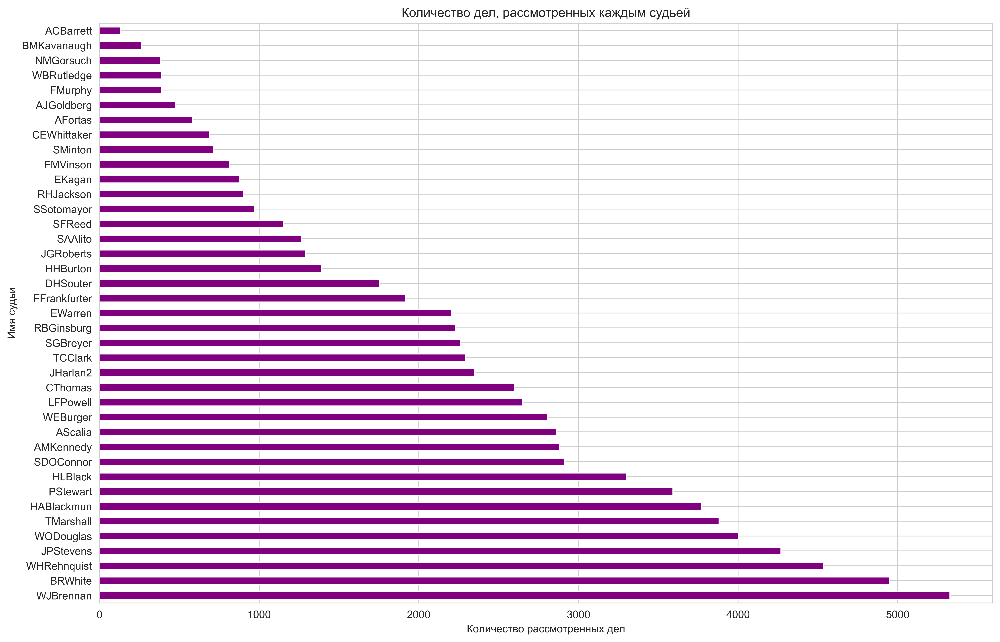

In [13]:
plt.figure(figsize=(15, 10), dpi=500)
justice_counts.plot(kind='barh', color='purple')
plt.ylabel('Имя судьи')
plt.xlabel('Количество рассмотренных дел')
plt.title('Количество дел, рассмотренных каждым судьей')
plt.show()

Топ 3 судьи с наибольшим кол-вом дел: WJBrennan, BRWhite, WHRehnquist

* Промежуток рассмотрения дел топ 3 судьями

WJBrennan

In [14]:
filtered_data_1 = df_justice[df_justice['justiceName'] == 'WJBrennan']

# минимальная и максимальная даты решений
min_date = filtered_data_1['dateDecision'].min()
max_date = filtered_data_1['dateDecision'].max()
# промежуток времени, в течение которого судья WJBrennan рассматривал дела
print(f'Судья WJBrennan рассматривал дела с {min_date} по {max_date}.')

Судья WJBrennan рассматривал дела с 1/1/1989 по 9/12/1958.


BRWhite

In [15]:
filtered_data_2 = df_justice[df_justice['justiceName'] == 'BRWhite']

# минимальная и максимальная даты решений
min_date = filtered_data_2['dateDecision'].min()
max_date = filtered_data_2['dateDecision'].max()

# промежуток времени, в течение которого судья WJBrennan рассматривал дела
print(f'Судья BRWhite рассматривал дела с {min_date} по {max_date}.')

Судья BRWhite рассматривал дела с 1/1/1989 по 7/8/1974.


WHRehnquist

In [16]:
filtered_data_3 = df_justice[df_justice['justiceName'] == 'WHRehnquist']

# минимальная и максимальная даты решений
min_date = filtered_data_3['dateDecision'].min()
max_date = filtered_data_3['dateDecision'].max()

# промежуток времени, в течение которого судья WJBrennan рассматривал дела
print(f'Судья WHRehnquist рассматривал дела с {min_date} по {max_date}.')

Судья WHRehnquist рассматривал дела с 1/1/1989 по 9/14/1995.


* Процент побед для каждого судьи

In [17]:
winning_cases_per_justice = df_justice[df_justice['partyWinning'] == 1].groupby('justiceName').size()
total_cases_per_justice = df_justice.groupby('justiceName').size()
winning_percentage_per_justice = (winning_cases_per_justice / total_cases_per_justice) * 100

In [18]:
print(winning_percentage_per_justice)

justiceName
ACBarrett       76.153846
AFortas         73.493976
AJGoldberg      74.947368
AMKennedy       62.885883
AScalia         62.250961
BMKavanaugh     68.821293
BRWhite         66.275778
CEWhittaker     61.215630
CThomas         65.036581
DHSouter        62.977752
EKagan          67.804323
EWarren         67.074830
FFrankfurter    57.068336
FMVinson        52.709360
FMurphy         55.813953
HABlackmun      63.404932
HHBurton        55.259366
HLBlack         63.325257
JGRoberts       68.449612
JHarlan2        67.758401
JPStevens       63.284911
LFPowell        65.874811
NMGorsuch       70.234987
PStewart        67.956570
RBGinsburg      64.647824
RHJackson       52.057842
SAAlito         68.512658
SDOConnor       61.358957
SFReed          53.518679
SGBreyer        66.076957
SMinton         51.882845
SSotomayor      68.589083
TCClark         62.827225
TMarshall       64.854419
WBRutledge      55.813953
WEBurger        65.930936
WHRehnquist     63.263506
WJBrennan       65.759339


/var/folders/4k/35_d_sbn5yd4_m6shy8krgsr0000gn/T/ipykernel_28178/2013445025.py:21: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  plt.colorbar(sm)


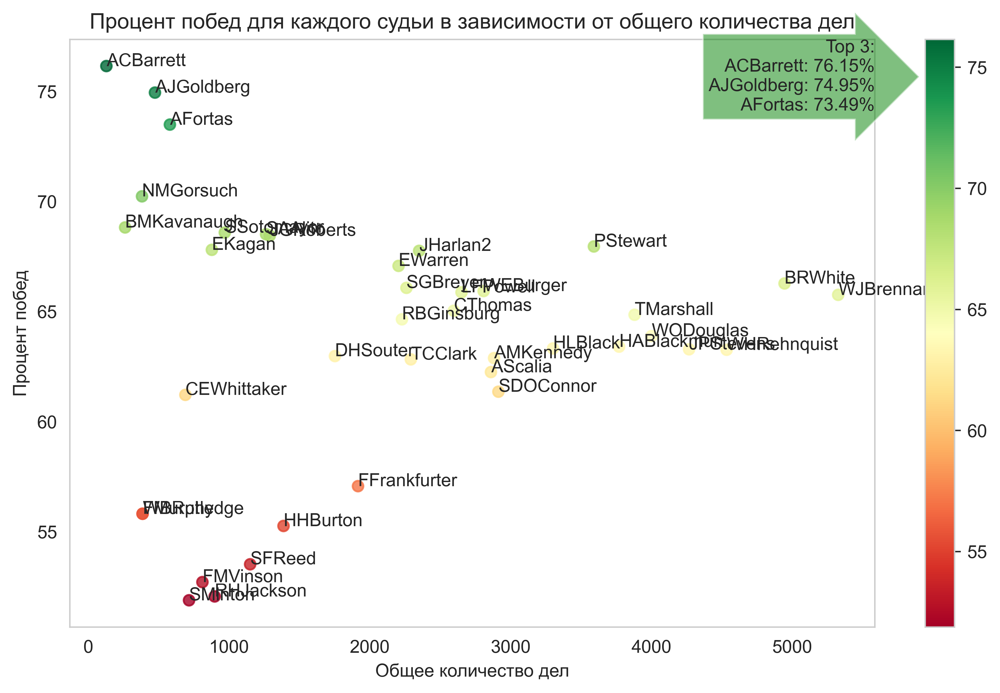

In [19]:
import numpy as np
import mplcursors

colors = winning_percentage_per_justice.values

norm = plt.Normalize(colors.min(), colors.max())

sm = plt.cm.ScalarMappable(cmap=plt.cm.RdYlGn, norm=norm)
sm.set_array([])

plt.figure(figsize=(10, 6), dpi=500)

plt.scatter(total_cases_per_justice, winning_percentage_per_justice, c=colors, cmap=plt.cm.RdYlGn, alpha=0.8)
plt.xlabel('Общее количество дел')
plt.ylabel('Процент побед')
plt.title('Процент побед для каждого судьи в зависимости от общего количества дел')

for i, justice in enumerate(winning_percentage_per_justice.index):
    plt.annotate(justice, (total_cases_per_justice[i], winning_percentage_per_justice[i]), fontsize=10)

plt.colorbar(sm)

top3 = winning_percentage_per_justice.nlargest(3)

plt.text(1, 1, f'Top 3:\n{top3.index[0]}: {round(top3[0], 2)}%\n{top3.index[1]}: {round(top3[1], 2)}%\n{top3.index[2]}: {round(top3[2], 2)}%', transform=plt.gca().transAxes, horizontalalignment='right', verticalalignment='top', bbox=dict(boxstyle='rarrow', facecolor='green', alpha=0.5))

cursor = mplcursors.cursor(hover=True)
cursor.connect("add", lambda sel: sel.annotation.set_text(str(round(sel.target[1], 2)) + '%'))

plt.grid()
plt.show()

ACBarrett - 76,15% побед в делах, рассмотренных судьей ACBarrett

* Распределение судей по областям права

In [20]:
justices_by_issue_area = df_justice.groupby(['justiceName', 'issueArea']).size().unstack()

In [21]:
justices_by_issue_area

issueArea,1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0,9.0,10.0,11.0,12.0,13.0,14.0,999.0
justiceName,,,,,,,,,,,,,,,
ACBarrett,29.0,23.0,10.0,5.0,3.0,NaN,5.0,25.0,13.0,5.0,3.0,2.0,2.0,2.0,3.0
AFortas,160.0,87.0,77.0,7.0,NaN,5.0,22.0,99.0,83.0,20.0,2.0,17.0,NaN,NaN,2.0
AJGoldberg,81.0,100.0,39.0,5.0,1.0,1.0,33.0,96.0,60.0,25.0,6.0,25.0,NaN,NaN,3.0
AMKennedy,757.0,468.0,176.0,101.0,57.0,47.0,72.0,526.0,398.0,156.0,32.0,64.0,16.0,3.0,10.0
AScalia,746.0,461.0,181.0,106.0,58.0,48.0,72.0,515.0,387.0,163.0,29.0,68.0,15.0,2.0,10.0
BMKavanaugh,52.0,45.0,19.0,9.0,6.0,2.0,7.0,64.0,28.0,13.0,3.0,4.0,5.0,3.0,3.0
BRWhite,1132.0,900.0,437.0,199.0,65.0,66.0,205.0,828.0,661.0,212.0,57.0,154.0,11.0,NaN,19.0
CEWhittaker,137.0,74.0,64.0,17.0,1.0,4.0,44.0,178.0,89.0,30.0,2.0,45.0,NaN,NaN,6.0
CThomas,673.0,438.0,150.0,90.0,54.0,33.0,54.0,501.0,354.0,136.0,30.0,52.0,15.0,6.0,11.0


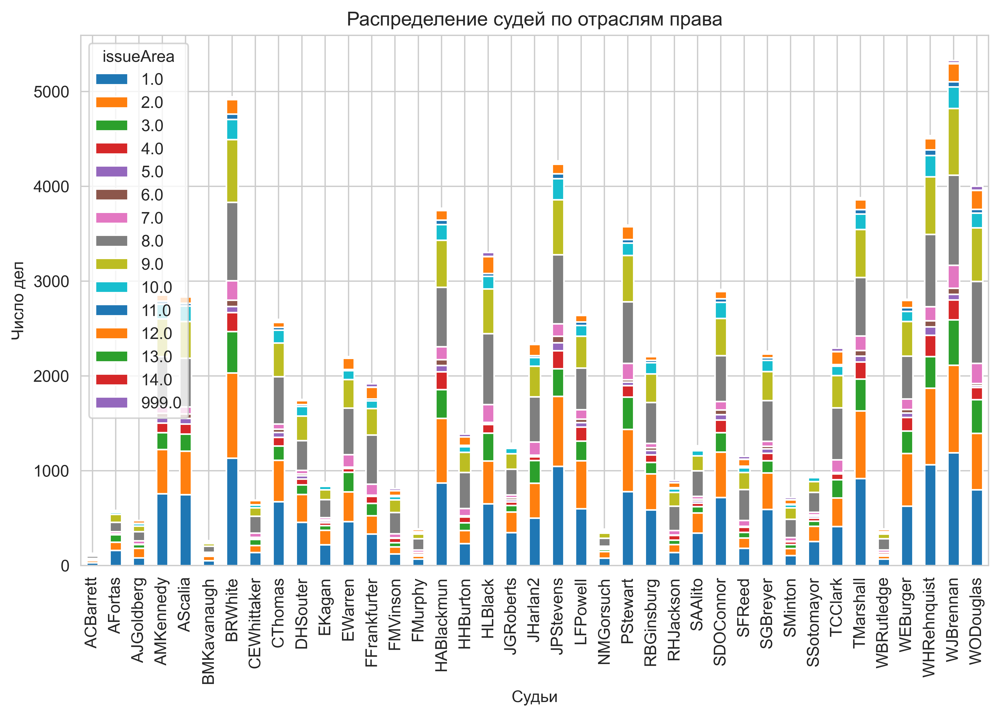

In [22]:
fig, ax = plt.subplots(figsize=(10, 6), dpi=500)

justices_by_issue_area.plot(kind='bar', stacked=True, ax=ax)

ax.set_xlabel('Судьи')
ax.set_ylabel('Число дел')
ax.set_title('Распределение судей по отраслям права')

plt.show()

In [23]:
# топ 3 судьи
justices = ['WJBrennan', 'BRWhite', 'WHRehnquist']
justice_counts = justices_by_issue_area.loc[justices].astype(float)

justice_counts

issueArea,1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0,9.0,10.0,11.0,12.0,13.0,14.0,999.0
justiceName,,,,,,,,,,,,,,,
WJBrennan,1188.0,924.0,481.0,208.0,61.0,63.0,243.0,949.0,706.0,226.0,54.0,191.0,9.0,NaN,24.0
BRWhite,1132.0,900.0,437.0,199.0,65.0,66.0,205.0,828.0,661.0,212.0,57.0,154.0,11.0,NaN,19.0
WHRehnquist,1063.0,808.0,334.0,223.0,89.0,65.0,148.0,762.0,609.0,225.0,59.0,119.0,14.0,NaN,17.0


Категория дел под номер 1 (Criminal Procedure) и 2 (Civil Rights) имеют наибольшое кол-во рассмотрений в суде

Values:
1 Criminal Procedure
2 Civil Rights
3 First Amendment
4 Due Process
5 Privacy
6 Attorneys
7 Unions
8 Economic Activity
9 Judicial Power
10 Federalism
11 Interstate Relations
12 Federal Taxation
13 Miscellaneous
14 Private Action
999 - Unknown

* Голосование каждого судьи

In [24]:
votes_per_justice = df_justice.groupby(['justiceName', 'vote']).size().unstack()

In [25]:
votes_per_justice

vote,0.0,1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0
justiceName,,,,,,,,,
ACBarrett,15.0,96.0,11.0,7.0,1.0,NaN,NaN,NaN,NaN
AFortas,43.0,440.0,56.0,13.0,17.0,2.0,NaN,5.0,5.0
AJGoldberg,23.0,367.0,39.0,21.0,18.0,NaN,NaN,4.0,3.0
AMKennedy,69.0,2328.0,230.0,136.0,87.0,13.0,NaN,3.0,17.0
AScalia,13.0,1941.0,473.0,179.0,223.0,10.0,NaN,3.0,19.0
BMKavanaugh,9.0,207.0,16.0,25.0,4.0,1.0,NaN,NaN,1.0
BRWhite,93.0,3893.0,570.0,114.0,181.0,19.0,2.0,16.0,58.0
CEWhittaker,39.0,475.0,139.0,10.0,19.0,NaN,NaN,NaN,9.0
CThomas,23.0,1656.0,501.0,208.0,185.0,5.0,1.0,3.0,15.0


In [26]:
for_against = ['WJBrennan', 'BRWhite', 'WHRehnquist']
for_against_counts = votes_per_justice.loc[for_against].astype(float)

for_against_counts

vote,0.0,1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0
justiceName,,,,,,,,,
WJBrennan,67.0,3684.0,1063.0,169.0,217.0,24.0,1.0,36.0,66.0
BRWhite,93.0,3893.0,570.0,114.0,181.0,19.0,2.0,16.0,58.0
WHRehnquist,98.0,3395.0,754.0,87.0,128.0,18.0,1.0,11.0,43.0


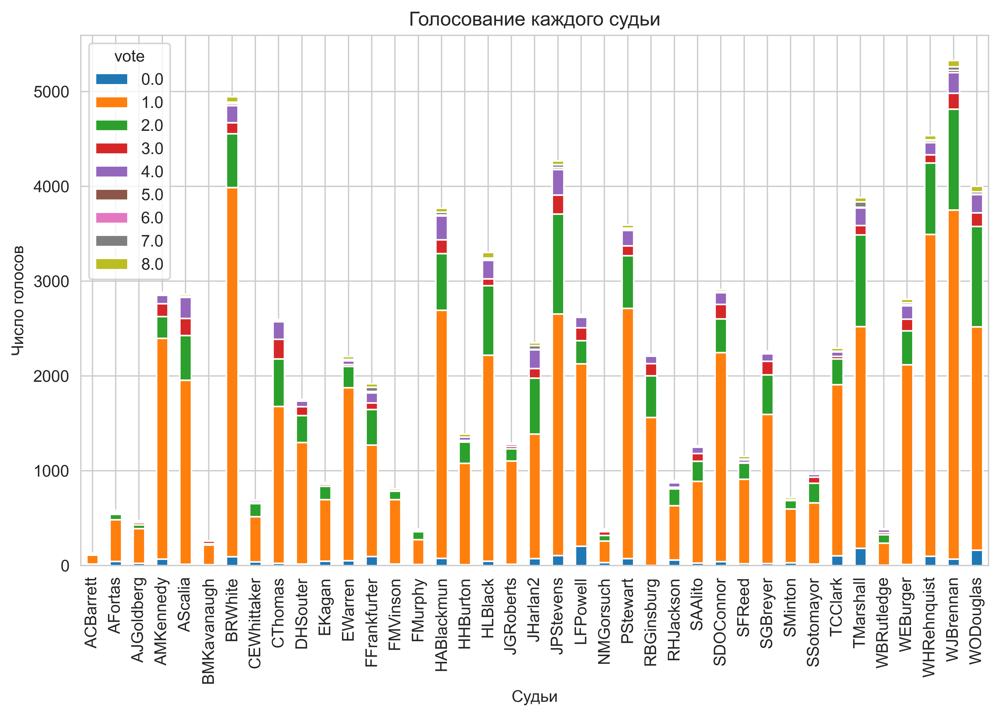

In [27]:
fig, ax = plt.subplots(figsize=(10, 6), dpi=500)

votes_per_justice.plot(kind='bar', stacked=True, ax=ax)

ax.set_xlabel('Судьи')
ax.set_ylabel('Число голосов')
ax.set_title('Голосование каждого судьи')

plt.show()

In [28]:
for_against_counts

vote,0.0,1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0
justiceName,,,,,,,,,
WJBrennan,67.0,3684.0,1063.0,169.0,217.0,24.0,1.0,36.0,66.0
BRWhite,93.0,3893.0,570.0,114.0,181.0,19.0,2.0,16.0,58.0
WHRehnquist,98.0,3395.0,754.0,87.0,128.0,18.0,1.0,11.0,43.0


Данные показывают, сколько раз каждый из топ 3 судей голосовал в каждом из вариантов голосования. Здесь используются следующие варианты голосования:

0 - unknown
1 - voted with majority or plurality
2 - dissent
3 - regular concurrence
4 - special concurrence
5 - judgment of the Court
6 - dissent from a denial or dismissal of certiorari , or dissent from summary affirmation of
an appeal
7 - jurisdictional dissent
8 - justice participated in an equally divided vote

WJBrennan проголосовал 3684 раза "1" (голосование с большинством или плюрализмом), 1063 раза "2" (диссидент), 169 раз "3" (обычное согласие), 217 раз "4" (особое согласие), 24 раза "5" (решение суда), один раз "6" (диссидент от отказа или отклонения кассации), 36 раз "7" (юрисдикционный диссидент) и 66 раз "8" (судья участвовал в равном делении голосов)

Наибольшее количество голосов было отдано варианту 1 - голосование с большинством или плюрализмом

* Соотношение мажоритарных и миноритарных мнений

In [29]:
majority_opinions_per_justice = df_justice[df_justice['majority'] == 2].groupby('justiceName').size()
minority_opinions_per_justice = df_justice[df_justice['majority'] == 1].groupby('justiceName').size()

In [30]:
print(majority_opinions_per_justice)

justiceName
ACBarrett        104
AFortas          472
AJGoldberg       406
AMKennedy       2564
AScalia         2353
BMKavanaugh      237
BRWhite         4207
CEWhittaker      504
CThomas         2054
DHSouter        1439
EKagan           686
EWarren         1890
FFrankfurter    1365
FMVinson         688
FMurphy          285
HABlackmun      3025
HHBurton        1118
HLBlack         2452
JGRoberts       1140
JHarlan2        1618
JPStevens       3039
LFPowell        2185
NMGorsuch        288
PStewart        2918
RBGinsburg      1771
RHJackson        638
SAAlito         1013
SDOConnor       2497
SFReed           932
SGBreyer        1802
SMinton          578
SSotomayor       741
TCClark         1881
TMarshall       2628
WBRutledge       285
WEBurger        2383
WHRehnquist     3628
WJBrennan       4094
WODouglas       2693
dtype: int64


In [31]:
print(minority_opinions_per_justice)

justiceName
ACBarrett         11
AFortas           61
AJGoldberg        43
AMKennedy        233
AScalia          476
BMKavanaugh       16
BRWhite          586
CEWhittaker      139
CThomas          504
DHSouter         289
EKagan           142
EWarren          234
FFrankfurter     421
FMVinson          87
FMurphy           84
HABlackmun       628
HHBurton         227
HLBlack          744
JGRoberts        128
JHarlan2         630
JPStevens       1082
LFPowell         244
NMGorsuch         63
PStewart         565
RBGinsburg       443
RHJackson        185
SAAlito          215
SDOConnor        355
SFReed           171
SGBreyer         425
SMinton           90
SSotomayor       207
TCClark          279
TMarshall       1024
WBRutledge        91
WEBurger         377
WHRehnquist      765
WJBrennan       1099
WODouglas       1083
dtype: int64


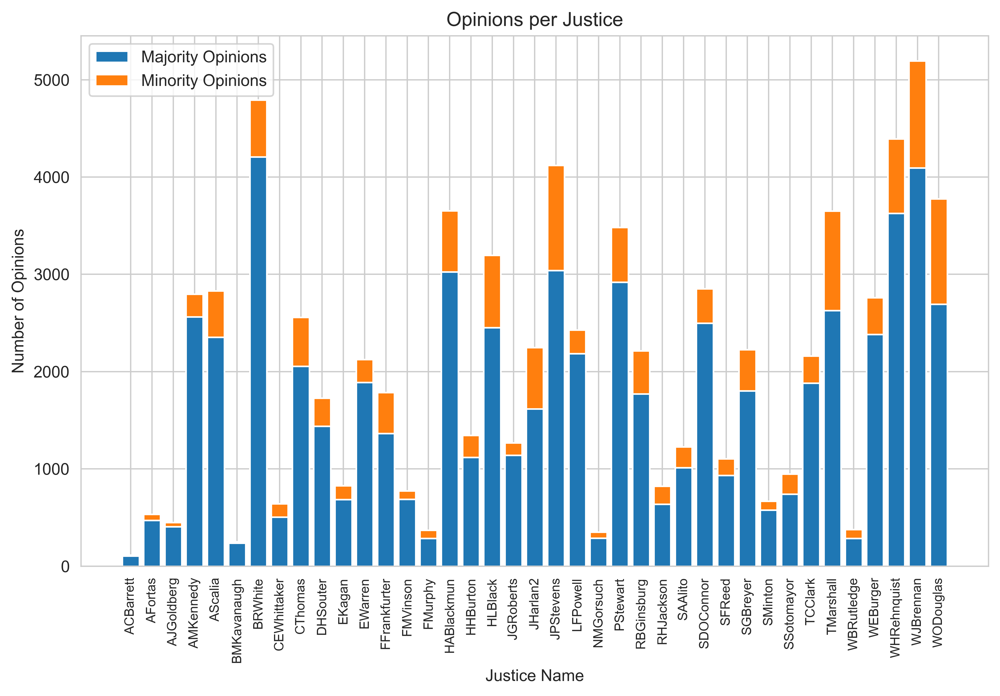

In [32]:
fig, ax = plt.subplots(figsize=(10, 6), dpi=500)

justice_names = list(majority_opinions_per_justice.index)
majority_opinions = list(majority_opinions_per_justice.values)
minority_opinions = list(minority_opinions_per_justice.values)
plt.bar(justice_names, majority_opinions, label='Majority Opinions')
plt.bar(justice_names, minority_opinions, bottom=majority_opinions, label='Minority Opinions')

plt.xticks(rotation=90, fontsize=8)
plt.xlabel('Justice Name')
plt.ylabel('Number of Opinions')
plt.title('Opinions per Justice')
plt.legend()

plt.show()

Большинство судей в своих решениях при голосовании придерживаются мажоритарного мнения

* Сроки рассмотрения дел

In [33]:
# преобразование колонок dateArgument и dateDecision в формат datetime
df_justice['dateArgument'] = pd.to_datetime(df_justice['dateArgument'])
df_justice['dateDecision'] = pd.to_datetime(df_justice['dateDecision'])

# разница между датой вынесения решения и датой устного обсуждения
time_diff = df_justice['dateDecision'] - df_justice['dateArgument']

min_days = time_diff.min().days
max_days = time_diff.max().days
mean_days = time_diff.mean().days

print(f"Минимальное количество дней между устным обсуждением и решением: {min_days} дней")
print(f"Максимальное количество дней между устным обсуждением и решением: {max_days} дней")
print(f"Среднее количество дней между устным обсуждением и решением: {mean_days} дней")

Минимальное количество дней между устным обсуждением и решением: 0 дней
Максимальное количество дней между устным обсуждением и решением: 799 дней
Среднее количество дней между устным обсуждением и решением: 80 дней


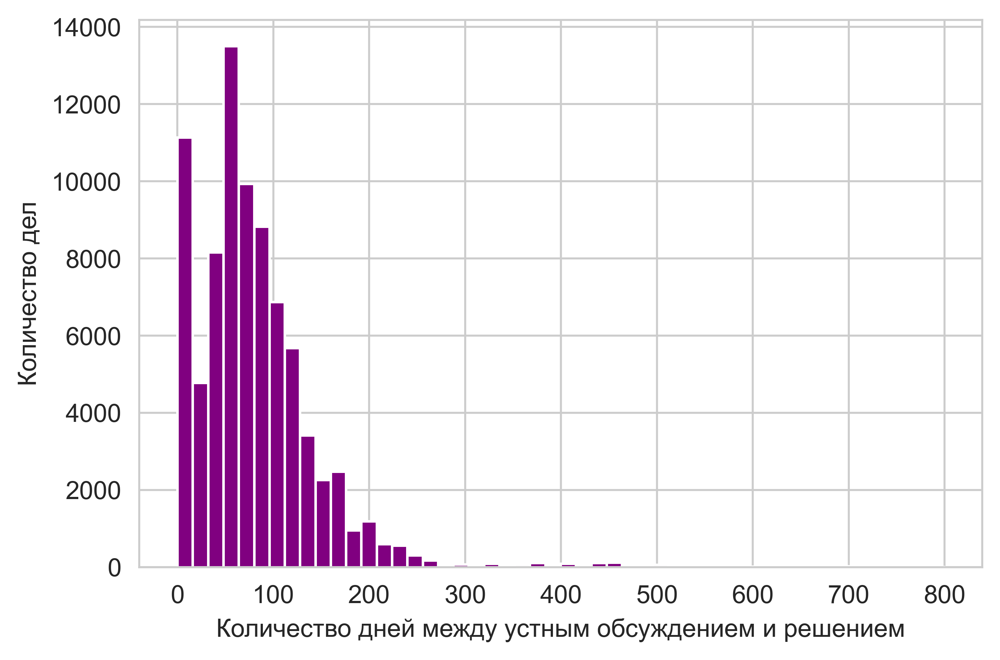

In [34]:
import matplotlib.pyplot as plt

plt.rcParams["figure.dpi"] = 500

plt.hist(time_diff.dt.days, bins=50, color='purple')
plt.xlabel('Количество дней между устным обсуждением и решением')
plt.ylabel('Количество дел')
plt.show()

* Типы истцов

In [35]:
# подсчет количества типов истицов
petitioner_counts = df_justice['petitioner'].value_counts()

print(petitioner_counts)

petitioner
28.0     8186
27.0     7775
100.0    5842
126.0    4428
19.0     2313
         ... 
303.0       9
305.0       9
22.0        9
319.0       9
221.0       8
Name: count, Length: 264, dtype: int64


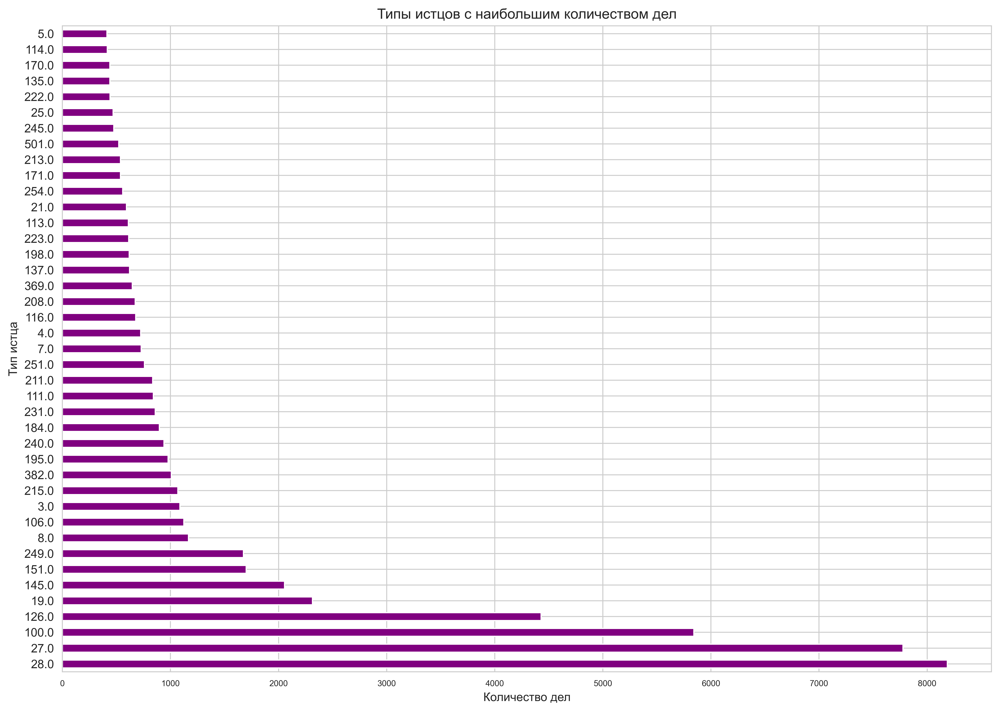

In [36]:
petitioner_top5 = petitioner_counts.sort_values(ascending=False)[:5]

fig, ax = plt.subplots(figsize=(14, 10), dpi = 500)
petitioner_top5.plot.barh(ax=ax, color='purple')

plt.xticks(fontsize=7)
plt.ylabel('Тип истца')
plt.xlabel('Количество дел')
plt.title('Типы истцов с наибольшим количеством дел')

plt.show()

Топ 5 типов истцов:
28 - State
27 - United States
100 - Person accused, indicted, or suspected of crime
126 - Person convicted of crime
19 - Governmental official, or an official of an agency established under an interstate compact

* Типы ответчиков

In [37]:
respondent_counts = df_justice['respondent'].value_counts()

print(respondent_counts)

respondent
28.0     12734
27.0      9643
100.0     3476
151.0     2440
19.0      2081
         ...  
370.0        9
321.0        9
356.0        9
307.0        9
422.0        9
Name: count, Length: 247, dtype: int64


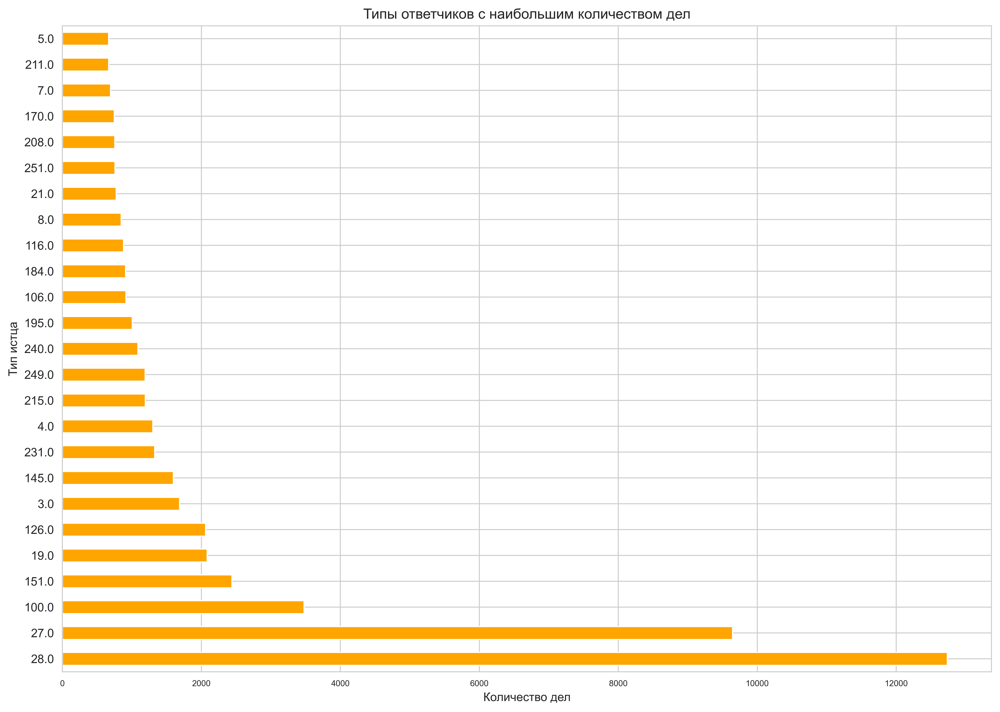

In [38]:
respondent_top = respondent_counts.sort_values(ascending=False)[:5]

fig, ax = plt.subplots(figsize=(14, 10), dpi = 500)
respondent_top.plot.barh(ax=ax, color='orange')

plt.xticks(fontsize=7)
plt.ylabel('Тип истца')
plt.xlabel('Количество дел')
plt.title('Типы ответчиков с наибольшим количеством дел')

plt.show()

Топ 5 типов ответчиков:
28 - State
27 - United States
100 - Person accused, indicted, or suspected of crime
3 - City, town, township, village, or borough government or governmental unit
151 - Employer. If employer's relations with employees are governed by the nature of the employer's business (e.g., railroad, boat), rather than labor law generally, the more specific designation is used in place of Employer.

* jurisdiction

Классификации различных видов дел в юрисдикции

In [39]:
jurisdiction_counts = df_justice['jurisdiction'].value_counts()

print(jurisdiction_counts)

jurisdiction
1.0      66586
2.0      13340
9.0       1471
6.0        188
8.0        170
12.0        81
4.0         72
5.0         45
15.0        18
14.0        18
7.0         17
999.0        9
Name: count, dtype: int64


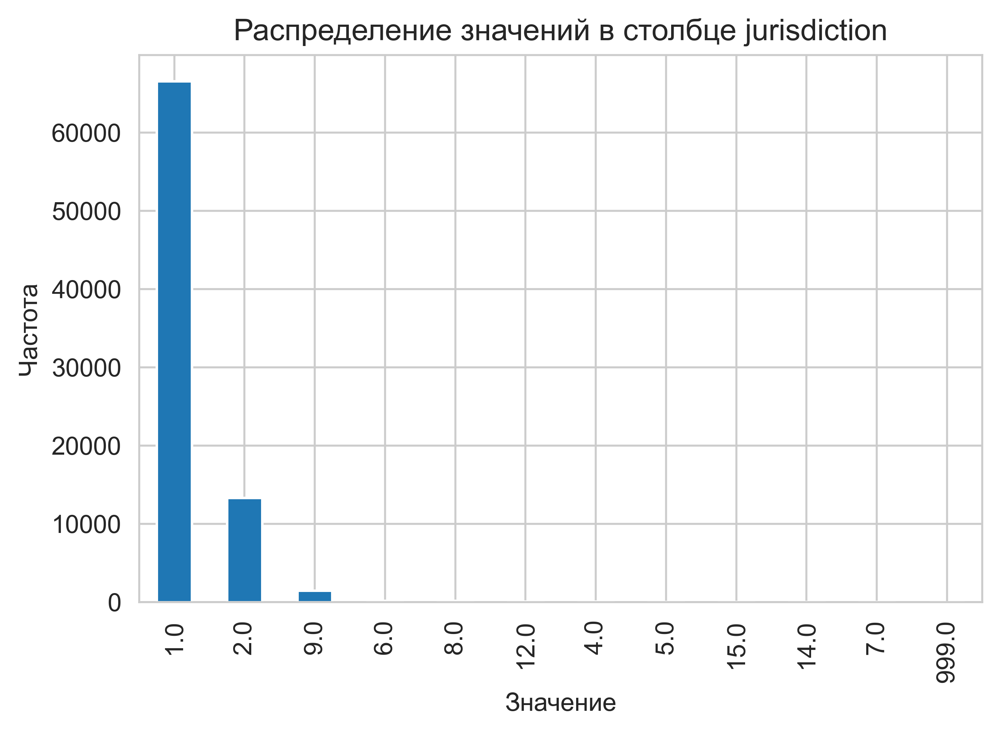

In [40]:
plt.rcParams["figure.dpi"] = 500

df_justice['jurisdiction'].value_counts().plot(kind='bar')
plt.title('Распределение значений в столбце jurisdiction')
plt.xlabel('Значение')
plt.ylabel('Частота')
plt.show()

Наибольшее количество дел рассматривалось в юрисдикциях:
1 - cert - дело было принято на рассмотрение в Верховный суд США после решения нижестоящих судов
2 - appeal - дело было обжаловано в нижестоящем суде
9 - original - дело было отправлено в Верховный суд США непосредственно, без предварительного рассмотрения нижестоящих судов

* partyWinning

Общая статистика

In [41]:
pw_counts = df_justice['partyWinning'].value_counts()

print(pw_counts)

partyWinning
1.0    52511
0.0    29288
3.0      153
2.0       63
Name: count, dtype: int64


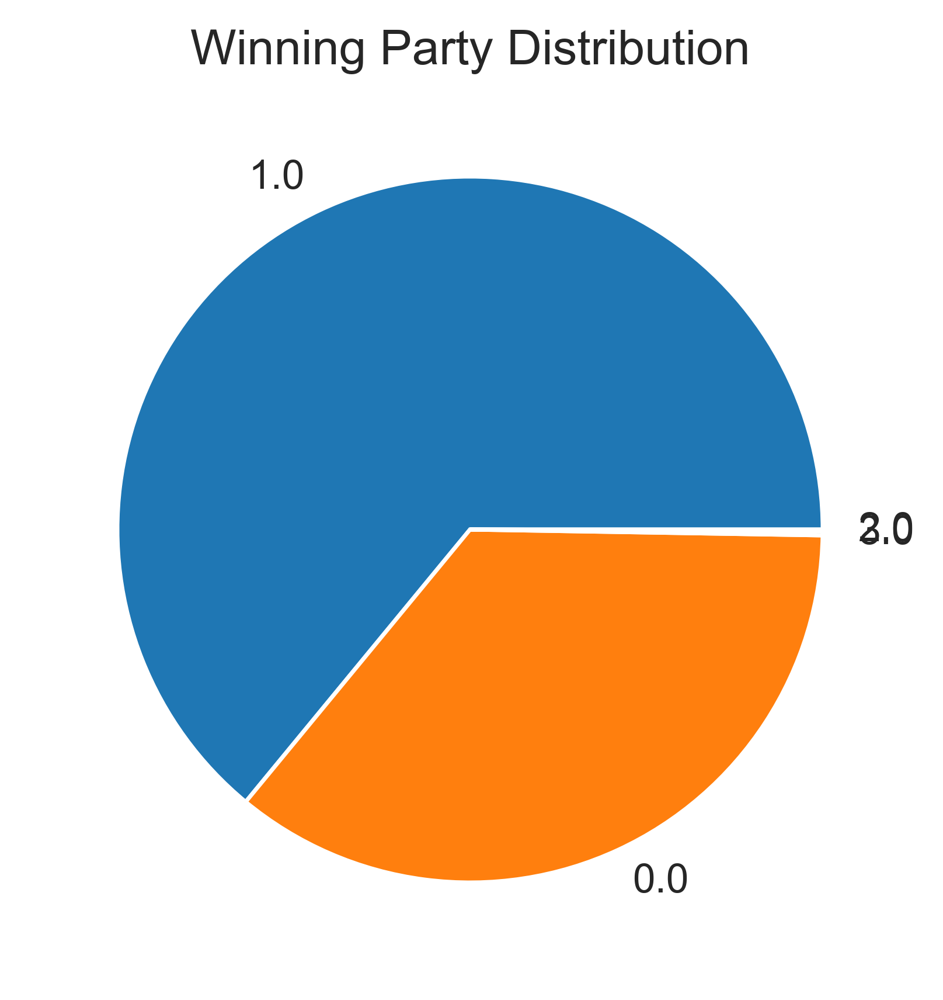

In [42]:
plt.figure(dpi=500)
plt.pie(pw_counts, labels=pw_counts.index)
plt.title('Winning Party Distribution')
plt.show()

В большинстве случаев подавшая петицию сторона получила благоприятное решение (1)

 Взаимосвязь между partyWinning и категориальными переменными

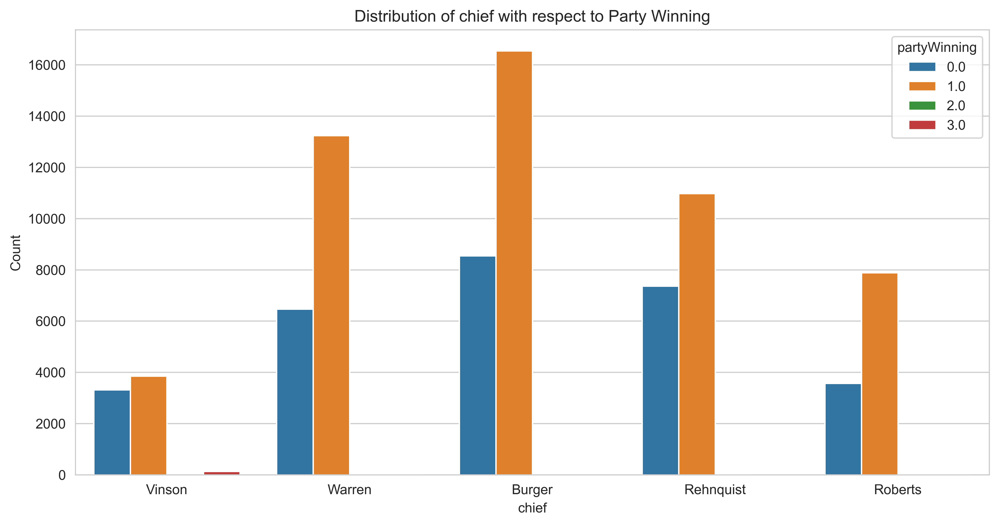

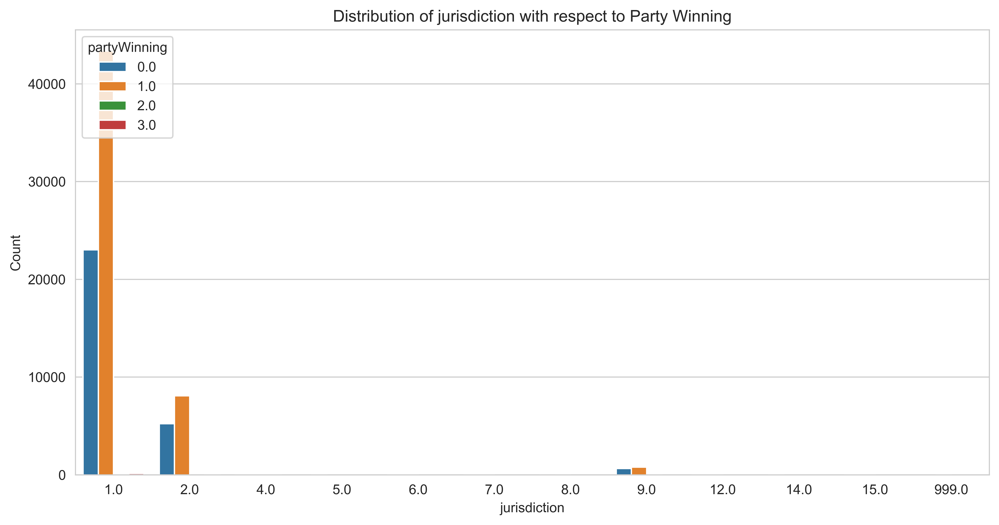

In [43]:
categorical_columns = ['chief', 'jurisdiction']
for col in categorical_columns:
    plt.figure(figsize=(12, 6), dpi = 500)
    sns.countplot(x=col, data=df_justice, hue='partyWinning')
    plt.xlabel(col)
    plt.ylabel("Count")
    plt.title(f"Distribution of {col} with respect to Party Winning")
    plt.show()

Анализ временных рядов

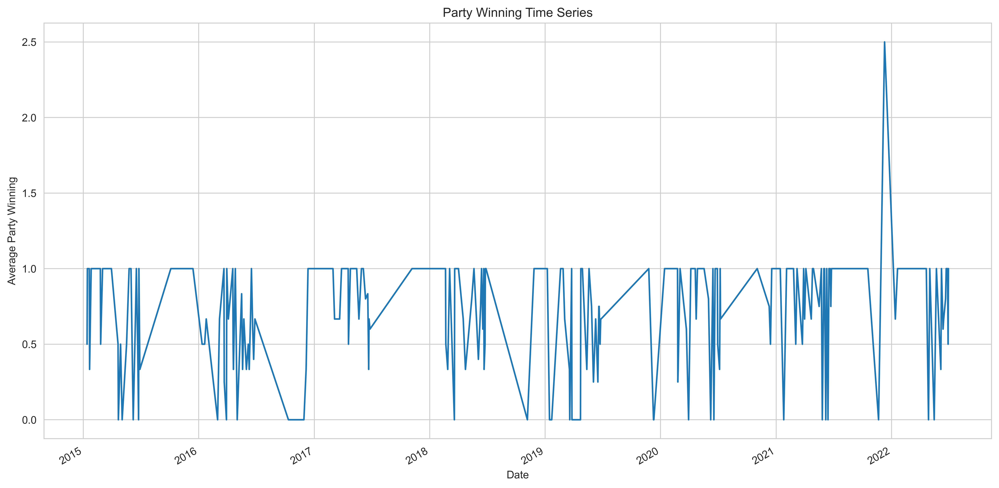

In [44]:
df_justice = df_justice.loc[df_justice['dateDecision'].dt.year.between(2015, 2022)]
df_justice_timeseries = df_justice.groupby('dateDecision')['partyWinning'].mean()

plt.figure(figsize=(16, 8))
df_justice_timeseries.plot()
plt.xlabel("Date")
plt.ylabel("Average Party Winning")
plt.title("Party Winning Time Series")
plt.show()

* Территориальность рассмотрения спора

In [45]:
case_state_counts = df_justice['caseOriginState'].value_counts()

case_state_counts = case_state_counts.drop(999)

print(case_state_counts)

caseOriginState
6.0     53
31.0    44
51.0    44
20.0    36
22.0    35
56.0    27
38.0    27
42.0    26
7.0     26
4.0     26
33.0    25
25.0    18
10.0    18
58.0    18
12.0    18
21.0    18
55.0    18
29.0    18
16.0    18
26.0    17
1.0     17
46.0    17
49.0     9
18.0     9
59.0     9
57.0     9
41.0     9
8.0      9
37.0     9
5.0      9
30.0     9
45.0     8
13.0     8
39.0     8
52.0     8
Name: count, dtype: int64


In [46]:
state_dict = {6: 'CA', 31.0: 'MT', 51.0: 'TX', 20.0: 'KS', 22.0: 'LA', 56.0: 'WA', 38.0: 'NC', 42.0: 'OK', 7.0: 'CO', 4.0: 'AZ', 33.0: 'NV', 25.0: 'MD', 10.0: 'DC', 58.0: 'WI', 12.0: 'FL', 21.0: 'KY', 55.0: 'VA', 29.0: 'MS', 16.0: 'ID', 26.0: 'MA', 1.0: 'AL', 46.0: 'PR', 49.0: 'SD', 18.0: 'IN', 59.0: 'WY', 57.0: 'WV', 41.0: 'OH', 8.0: 'CT', 37.0: 'NY', 5.0: 'AR', 30.0: 'MO', 45.0: 'PA', 13.0: 'GA', 39.0: 'ND', 52.0: 'UT'}

new_case_state = df_justice[df_justice['caseOriginState'] != 999]

name_state = new_case_state['caseOriginState'] = new_case_state['caseOriginState'].replace(state_dict)

/var/folders/4k/35_d_sbn5yd4_m6shy8krgsr0000gn/T/ipykernel_28178/1679439667.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  name_state = new_case_state['caseOriginState'] = new_case_state['caseOriginState'].replace(state_dict)


In [47]:
name_state_counts = name_state.value_counts()

print(name_state_counts)

caseOriginState
CA    53
MT    44
TX    44
KS    36
LA    35
NC    27
WA    27
AZ    26
OK    26
CO    26
NV    25
KY    18
MS    18
VA    18
DC    18
WI    18
MD    18
ID    18
FL    18
PR    17
MA    17
AL    17
OH     9
IN     9
WY     9
WV     9
SD     9
AR     9
MO     9
CT     9
NY     9
ND     8
GA     8
UT     8
PA     8
Name: count, dtype: int64


In [48]:
import plotly.graph_objects as go

name_state_counts = name_state.value_counts()

df = pd.DataFrame({'state': name_state_counts.index, 'cases': name_state_counts.values})

colorscale = [[0, '#F9EBFF'], [0.2, '#E2C6FF'], [0.4, '#CA9BFF'], [0.6, '#B26FFF'], [0.8, '#9A44FF'], [1, '#8200FF']]

fig = go.Figure(data=go.Choropleth(
    locations=df['state'],
    z=df['cases'].astype(float),
    locationmode='USA-states',
    colorscale=colorscale,
    colorbar_title="Количество дел",
))

fig.update_layout(
    title_text='Территориальность рассмотрения спора по штатам',
    geo_scope='usa',
)

fig.show()

* Прецедентное изменение

In [49]:
precedent_counts = df_justice['precedentAlteration'].value_counts()

print(precedent_counts)

precedentAlteration
0.0    4772
1.0     135
Name: count, dtype: int64


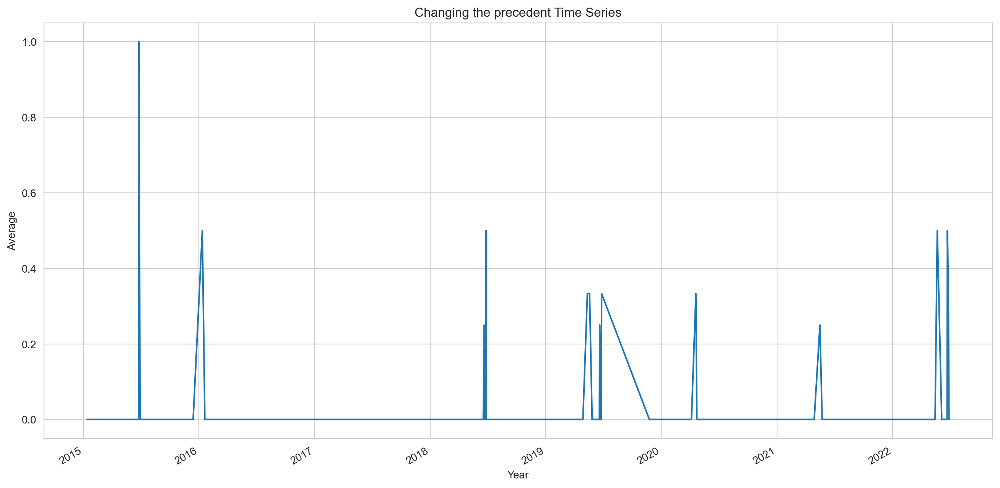

In [50]:
df_precedent = df_justice.loc[df_justice['dateDecision'].dt.year.between(2000, 2022)]
df_justice_precedent = df_precedent.groupby('dateDecision')['precedentAlteration'].mean()

plt.figure(figsize=(16, 8), dpi = 200)
df_justice_precedent.plot()
plt.xlabel("Year")
plt.ylabel("Average")
plt.title("Changing the precedent Time Series")
plt.show()

Больше всего прецедентов было изменено в середине 2015 года

Значения:
0 - отсутствие изменения прецедента
1 - прецедент изменен

* Идеологическая направленность решения

In [51]:
direction_counts = df_justice['decisionDirection'].value_counts()

print(direction_counts)

decisionDirection
1.0    2409
2.0    2275
3.0     223
Name: count, dtype: int64


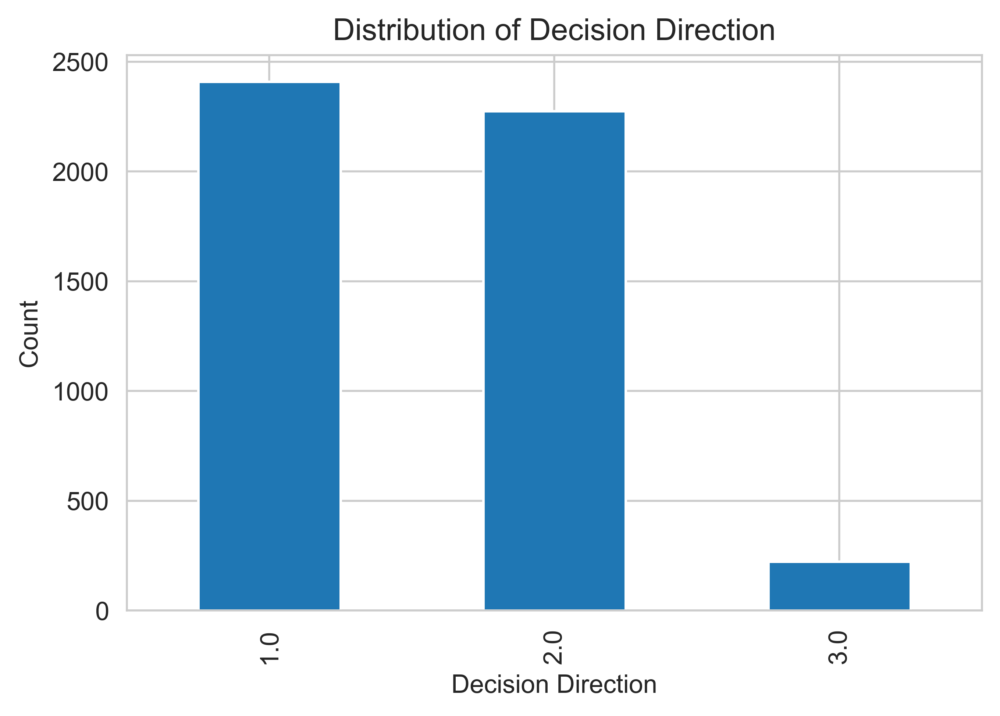

In [52]:
import matplotlib.pyplot as plt

direction_counts.plot(kind='bar')

plt.xlabel('Decision Direction')
plt.ylabel('Count')
plt.title('Distribution of Decision Direction')

plt.savefig('decision_directions.png', dpi=500)
plt.show()

In [53]:
# Подсчет количества значений в колонке decisionDirection в зависимости от jurisdiction
direction_counts_mix = df_justice.groupby(['jurisdiction', 'decisionDirection']).size()

print(direction_counts_mix)

jurisdiction  decisionDirection
1.0           1.0                  2320
              2.0                  2206
              3.0                   152
2.0           1.0                    80
              2.0                    60
9.0           3.0                    71
12.0          1.0                     9
              2.0                     9
dtype: int64


jurisdiction:
1 cert
2 appeal
9 original
12 stay

При принятии решения на подтверждение, апелляционное рассмотрение, приостановление исполнения судебного решения, судьи опираются на консервативные убеждения.


Корреляция

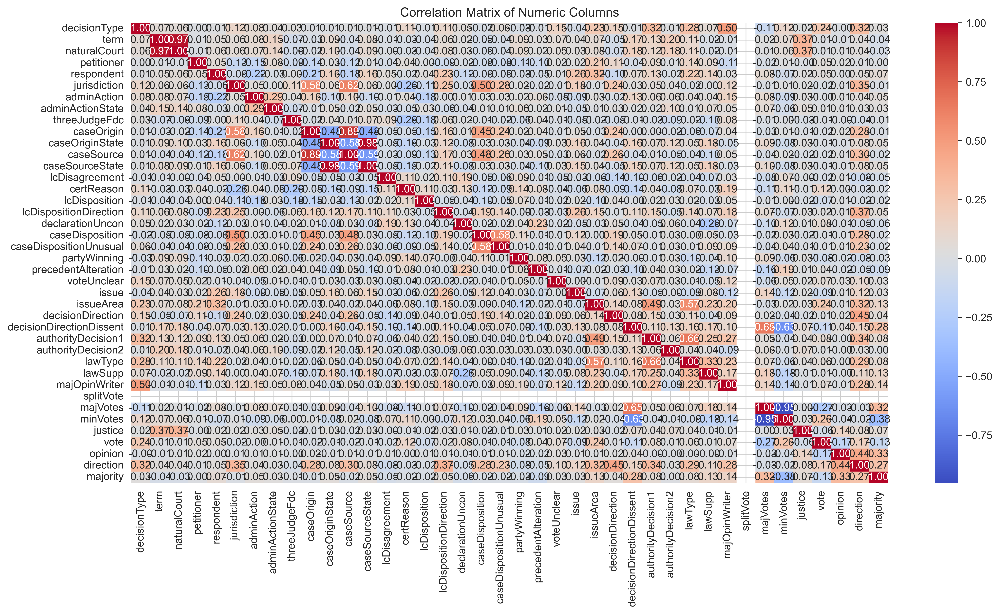

In [54]:
numeric_columns = df_justice.select_dtypes(include=np.number).columns
correlation_matrix = df_justice[numeric_columns].corr()

plt.figure(figsize=(16, 8), dpi = 500)
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Correlation Matrix of Numeric Columns")
plt.show()

---------

 # 1) Ideological beliefs

In [55]:
df_new_justice = df_justice.drop(columns = ['justice', 'docketId', 'caseIssuesId', 'voteId','dateDecision',
                                         'lexisCite', 'caseName',
                                        'adminActionState', 'caseOriginState',
                                        'caseSourceState', 'declarationUncon',
                                        'caseDispositionUnusual', 'partyWinning', 'voteUnclear',
                                        'decisionDirectionDissent', 'authorityDecision1', 'authorityDecision2', 'majOpinWriter',
                                        'splitVote', 'dateArgument', 'dateRearg',
                                        'term', 'caseDisposition', 'decisionDirection',
                                        'majVotes', 'minVotes', 'majority', 'vote', 'opinion',
                                       'precedentAlteration', 'issueArea'])

In [56]:
df_new_justice.head()

,caseId,decisionType,naturalCourt,chief,petitioner,respondent,jurisdiction,adminAction,threeJudgeFdc,caseOrigin,caseSource,lcDisagreement,certReason,lcDisposition,lcDispositionDirection,issue,lawType,lawSupp,justiceName,direction
77045,2014-003,1,1704,Roberts,215.0,7.0,1.0,999.0,0.0,46.0,28.0,0.0,12.0,2.0,1.0,30160.0,6.0,600.0,JGRoberts,2.0
77046,2014-003,1,1704,Roberts,215.0,7.0,1.0,999.0,0.0,46.0,28.0,0.0,12.0,2.0,1.0,30160.0,6.0,600.0,AScalia,2.0
77047,2014-003,1,1704,Roberts,215.0,7.0,1.0,999.0,0.0,46.0,28.0,0.0,12.0,2.0,1.0,30160.0,6.0,600.0,AMKennedy,2.0
77048,2014-003,1,1704,Roberts,215.0,7.0,1.0,999.0,0.0,46.0,28.0,0.0,12.0,2.0,1.0,30160.0,6.0,600.0,CThomas,2.0
77049,2014-003,1,1704,Roberts,215.0,7.0,1.0,999.0,0.0,46.0,28.0,0.0,12.0,2.0,1.0,30160.0,6.0,600.0,RBGinsburg,2.0


In [57]:
# Удаляем строки с отсутствующими значениями в столбце 'direction'
df_new_justice = df_new_justice.dropna(subset=['direction'])

# Заполняем отсутствующие значения в объекте DataFrame значением 999
df_new_justice = df_new_justice.fillna(999)

# Создаем словарь для отображения значений
d = {1: 0, 2: 1}

# Применяем отображение словаря к столбцу 'direction'
df_new_justice['direction'] = df_new_justice['direction'].map(d)

In [58]:
# Генерация списка столбцов для преобразования в категориальные переменные
dummy_1 = ['caseId', 'justiceName', 'direction']
columns_dummy = [col for col in df_new_justice.columns if col not in dummy_1]

print(columns_dummy)

['decisionType', 'naturalCourt', 'chief', 'petitioner', 'respondent', 'jurisdiction', 'adminAction', 'threeJudgeFdc', 'caseOrigin', 'caseSource', 'lcDisagreement', 'certReason', 'lcDisposition', 'lcDispositionDirection', 'issue', 'lawType', 'lawSupp']


In [59]:
# Преобразование категориальных признаков в фиктивные переменные
df_new_justice = pd.get_dummies(df_new_justice, columns=columns_dummy)

In [60]:
df_new_justice.head()

,caseId,justiceName,direction,decisionType_1,decisionType_2,decisionType_4,decisionType_5,decisionType_6,decisionType_7,naturalCourt_1704,...,lawSupp_401.0,lawSupp_502.0,lawSupp_506.0,lawSupp_508.0,lawSupp_509.0,lawSupp_510.0,lawSupp_600.0,lawSupp_800.0,lawSupp_900.0,lawSupp_999.0
77045,2014-003,JGRoberts,1.0,True,False,False,False,False,False,True,...,False,False,False,False,False,False,True,False,False,False
77046,2014-003,AScalia,1.0,True,False,False,False,False,False,True,...,False,False,False,False,False,False,True,False,False,False
77047,2014-003,AMKennedy,1.0,True,False,False,False,False,False,True,...,False,False,False,False,False,False,True,False,False,False
77048,2014-003,CThomas,1.0,True,False,False,False,False,False,True,...,False,False,False,False,False,False,True,False,False,False
77049,2014-003,RBGinsburg,1.0,True,False,False,False,False,False,True,...,False,False,False,False,False,False,True,False,False,False


In [61]:
justice_counts = df_new_justice['justiceName'].value_counts()

print(justice_counts)

justiceName
JGRoberts      555
CThomas        555
SGBreyer       555
SAAlito        555
SSotomayor     555
EKagan         555
RBGinsburg     425
NMGorsuch      383
AMKennedy      292
BMKavanaugh    263
ACBarrett      130
AScalia         84
Name: count, dtype: int64


In [62]:
df_new_justice = df_new_justice.fillna(999)

In [63]:
# Проверяем наличие пропущенных значений
if df_new_justice.isna().any().any():
    print("Пропущенные значения (NaN или NULL) есть в DataFrame df_new_justice.")
else:
    print("Пропущенные значения (NaN или NULL) отсутствуют в DataFrame df_new_justice.")

Пропущенные значения (NaN или NULL) отсутствуют в DataFrame df_new_justice.


In [64]:
# Удаление дефиса из столбца caseId
df_new_justice['caseId'] = df_new_justice['caseId'].str.replace('-', '')

# Разделение числа года и номера дела на отдельные столбцы
df_new_justice['year'] = df_new_justice['caseId'].str[:4]
df_new_justice['caseNumber'] = df_new_justice['caseId'].str[4:]

# Преобразование числа года и номера дела в формат числа с плавающей точкой
df_new_justice['year'] = df_new_justice['year'].astype(float)
df_new_justice['caseNumber'] = df_new_justice['caseNumber'].astype(float)

# Выполнение арифметической операции деления для объединения чисел года и номера дела
df_new_justice['caseId'] = df_new_justice['year'] + df_new_justice['caseNumber'] / 1000

# Удаление лишних столбцов
df_new_justice.drop(['year', 'caseNumber'], axis=1, inplace=True)

print(df_new_justice)

         caseId  justiceName  direction  decisionType_1  decisionType_2   
77045  2014.003    JGRoberts        1.0            True           False  \
77046  2014.003      AScalia        1.0            True           False   
77047  2014.003    AMKennedy        1.0            True           False   
77048  2014.003      CThomas        1.0            True           False   
77049  2014.003   RBGinsburg        1.0            True           False   
...         ...          ...        ...             ...             ...   
82010  2021.069   SSotomayor        1.0            True           False   
82011  2021.069       EKagan        1.0            True           False   
82012  2021.069    NMGorsuch        0.0            True           False   
82013  2021.069  BMKavanaugh        1.0            True           False   
82014  2021.069    ACBarrett        0.0            True           False   

       decisionType_4  decisionType_5  decisionType_6  decisionType_7   
77045           False     

In [65]:
print(df_new_justice['caseId'].dtype)

float64


---------

MLM - Ideological beliefs

* LR

In [66]:
import pandas as pd
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report

In [67]:
metrics_df_ideological = pd.DataFrame(columns=['Model', 'Accuracy', 'Precision', 'Recall', 'F1-Score'])

In [68]:
model_df = df_new_justice.drop(columns = ['caseId', 'justiceName'])

In [69]:
# Разделение данных на признаки (X) и целевую переменную (y)
X = model_df.drop("direction", axis=1)
y = model_df["direction"]

# Разделение данных на обучающую и тестовую выборки
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [70]:
# Создание и обучение модели логистической регрессии
model = LogisticRegression()
model.fit(X_train, y_train)

/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



LogisticRegression()

In [71]:
# Прогнозирование на тестовых данных
y_pred = model.predict(X_test)

# Оценка производительности модели
accuracy = accuracy_score(y_test, y_pred)
report = classification_report(y_test, y_pred)

# Вывод результатов
print("Accuracy:", accuracy)
print("Classification Report:", report)

Accuracy: 0.7657841140529531
Classification Report:               precision    recall  f1-score   support

         0.0       0.77      0.76      0.76       470
         1.0       0.74      0.77      0.75       450
       999.0       1.00      0.77      0.87        62

    accuracy                           0.77       982
   macro avg       0.84      0.77      0.80       982
weighted avg       0.77      0.77      0.77       982



In [72]:
# Confusion Matrix

from sklearn.metrics import confusion_matrix

cnf_matrix_lr = confusion_matrix(y_test, y_pred)
print('Confusion Matrix:\n', cnf_matrix_lr)

Confusion Matrix:
 [[357 113   0]
 [103 347   0]
 [  4  10  48]]


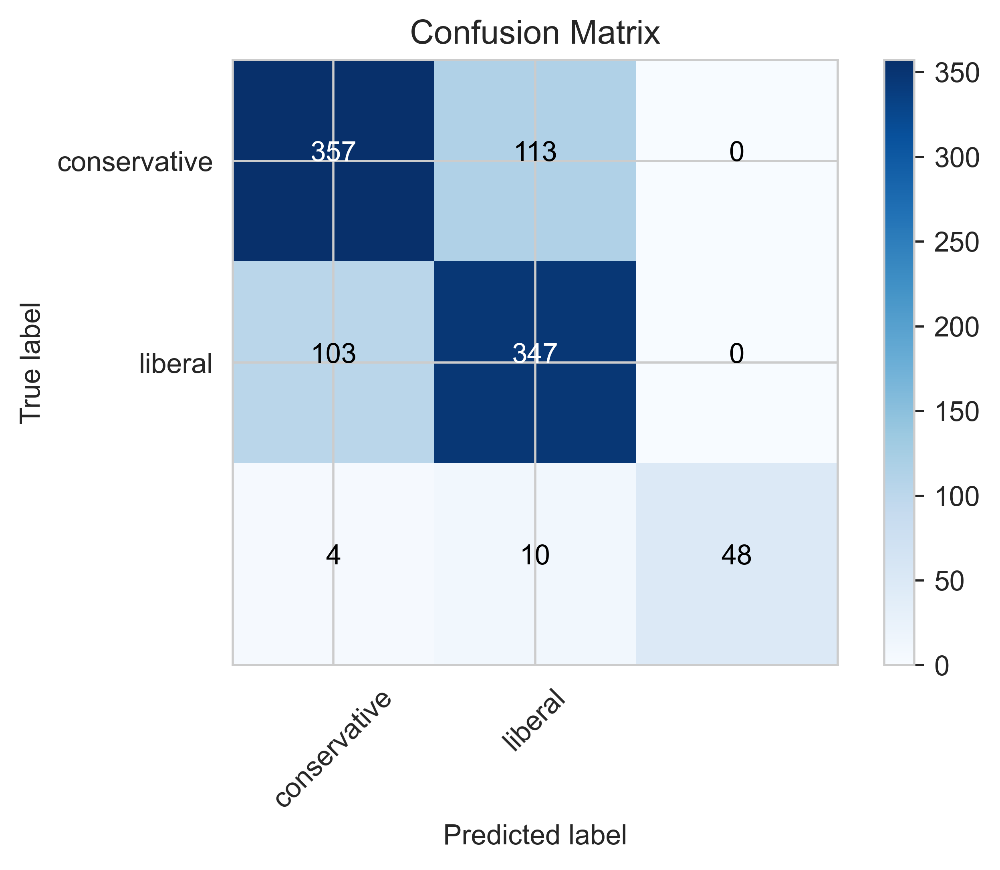

In [73]:
import itertools

plt.imshow(cnf_matrix_lr,  cmap=plt.cm.Blues)

plt.title('Confusion Matrix')
plt.ylabel('True label')
plt.xlabel('Predicted label')

class_names = ['conservative', 'liberal']
tick_marks = np.arange(len(class_names))
plt.xticks(tick_marks, class_names, rotation=45)
plt.yticks(tick_marks, class_names)

thresh = cnf_matrix_lr.max() / 2.

for i, j in itertools.product(range(cnf_matrix_lr.shape[0]), range(cnf_matrix_lr.shape[1])):
        plt.text(j, i, cnf_matrix_lr[i, j],
                 horizontalalignment="center",
                 color="white" if cnf_matrix_lr[i, j] > thresh else "black")

plt.colorbar()

plt.savefig('confusion_matrix.png', dpi=500)

* Random Forest

In [74]:
from sklearn.ensemble import RandomForestClassifier

In [75]:
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)

RandomForestClassifier(random_state=42)

In [76]:
y_pred_2 = rf_model.predict(X_test)

In [77]:
# Оценка точности модели
accuracy = accuracy_score(y_test, y_pred_2)
print("Accuracy:", accuracy)

classification_rep = classification_report(y_test, y_pred_2)
print("Classification Report:\n", classification_rep)

Accuracy: 0.774949083503055
Classification Report:
               precision    recall  f1-score   support

         0.0       0.77      0.79      0.78       470
         1.0       0.76      0.76      0.76       450
       999.0       0.98      0.77      0.86        62

    accuracy                           0.77       982
   macro avg       0.84      0.77      0.80       982
weighted avg       0.78      0.77      0.78       982



Confusion Matrix:
 [[373  96   1]
 [110 340   0]
 [  4  10  48]]


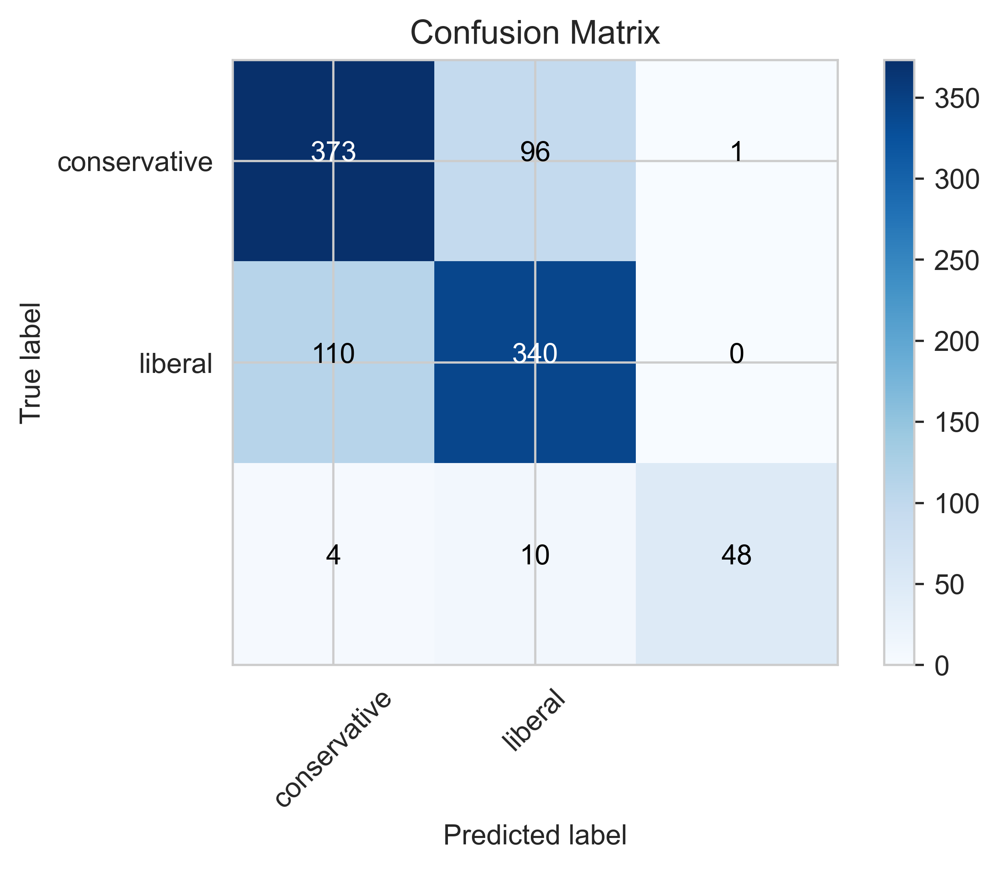

In [78]:
# Confusion Matrix
cnf_matrix_rf = confusion_matrix(y_test, y_pred_2)
print('Confusion Matrix:\n', cnf_matrix_rf)

plt.imshow(cnf_matrix_rf,  cmap=plt.cm.Blues)

plt.title('Confusion Matrix')
plt.ylabel('True label')
plt.xlabel('Predicted label')

class_names = ['conservative', 'liberal']
tick_marks = np.arange(len(class_names))
plt.xticks(tick_marks, class_names, rotation=45)
plt.yticks(tick_marks, class_names)

thresh = cnf_matrix_rf.max() / 2.

for i, j in itertools.product(range(cnf_matrix_rf.shape[0]), range(cnf_matrix_rf.shape[1])):
        plt.text(j, i, cnf_matrix_rf[i, j],
                 horizontalalignment="center",
                 color="white" if cnf_matrix_rf[i, j] > thresh else "black")

plt.colorbar()

plt.savefig('confusion_matrix.png', dpi=500)

* Decision Tree

In [79]:
from sklearn.tree import DecisionTreeClassifier

In [80]:
dt_model = DecisionTreeClassifier(random_state=42)
dt_model.fit(X_train, y_train)

y_pred_3 = dt_model.predict(X_test)

# Оценка точности модели
accuracy = accuracy_score(y_test, y_pred_3)
print("Accuracy:", accuracy)

classification_rep = classification_report(y_test, y_pred_3)
print("Classification Report:\n", classification_rep)

Accuracy: 0.7780040733197556
Classification Report:
               precision    recall  f1-score   support

         0.0       0.75      0.83      0.79       470
         1.0       0.78      0.73      0.75       450
       999.0       1.00      0.77      0.87        62

    accuracy                           0.78       982
   macro avg       0.85      0.78      0.81       982
weighted avg       0.78      0.78      0.78       982



Confusion Matrix:
 [[389  81   0]
 [123 327   0]
 [  4  10  48]]


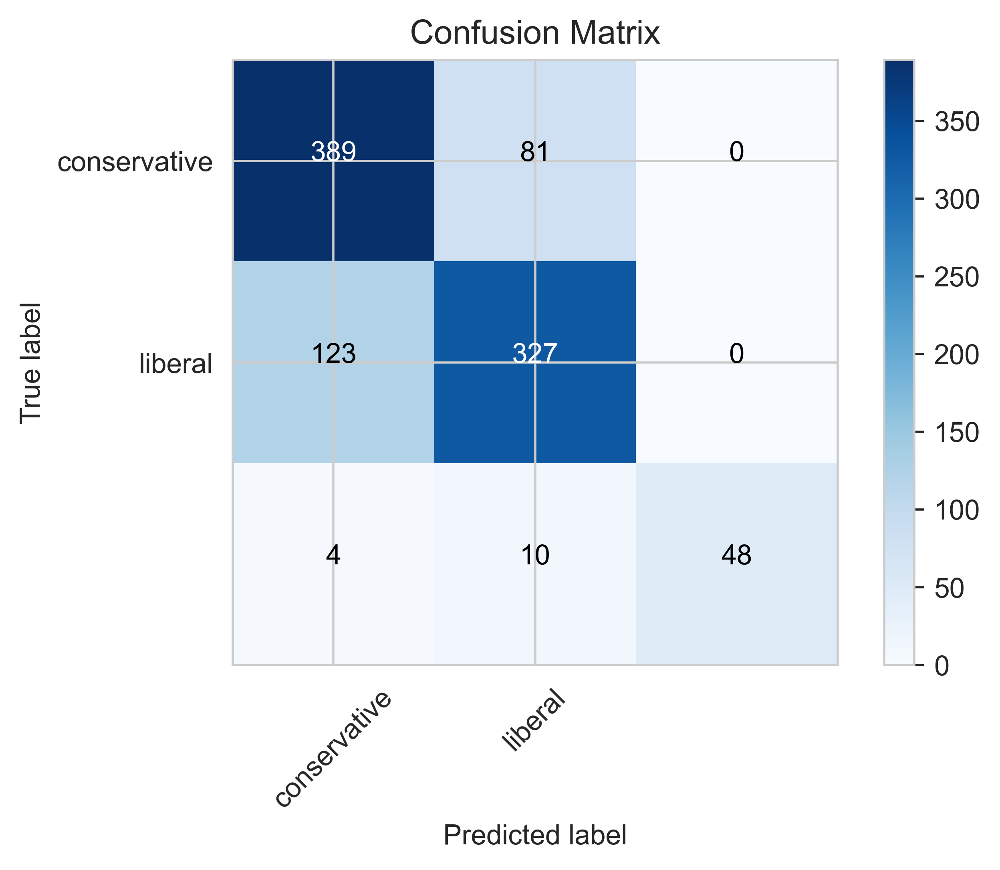

In [81]:
# Confusion Matrix
cnf_matrix_dt = confusion_matrix(y_test, y_pred_3)
print('Confusion Matrix:\n', cnf_matrix_dt)

plt.imshow(cnf_matrix_dt,  cmap=plt.cm.Blues)

plt.title('Confusion Matrix')
plt.ylabel('True label')
plt.xlabel('Predicted label')

class_names = ['conservative', 'liberal']
tick_marks = np.arange(len(class_names))
plt.xticks(tick_marks, class_names, rotation=45)
plt.yticks(tick_marks, class_names)

thresh = cnf_matrix_dt.max() / 2.

for i, j in itertools.product(range(cnf_matrix_dt.shape[0]), range(cnf_matrix_dt.shape[1])):
        plt.text(j, i, cnf_matrix_dt[i, j],
                 horizontalalignment="center",
                 color="white" if cnf_matrix_dt[i, j] > thresh else "black")

plt.colorbar()

plt.savefig('confusion_matrix.png', dpi=500)

* Support Vector Machines, SVM

In [82]:
from sklearn.svm import SVC

In [83]:
# SVM model
svm_model = SVC(random_state=42)
svm_model.fit(X_train, y_train)

y_pred_4 = svm_model.predict(X_test)

# Оценка точности модели
accuracy = accuracy_score(y_test, y_pred_4)
print("Accuracy:", accuracy)

classification_rep = classification_report(y_test, y_pred_4)
print("Classification Report:\n", classification_rep)

Accuracy: 0.7718940936863544
Classification Report:
               precision    recall  f1-score   support

         0.0       0.78      0.76      0.77       470
         1.0       0.74      0.78      0.76       450
       999.0       1.00      0.77      0.87        62

    accuracy                           0.77       982
   macro avg       0.84      0.77      0.80       982
weighted avg       0.78      0.77      0.77       982



In [84]:
# Confusion Matrix

from sklearn.metrics import confusion_matrix

cnf_matrix_svm = confusion_matrix(y_test, y_pred_4)
print('Confusion Matrix:\n', cnf_matrix_svm)

Confusion Matrix:
 [[358 112   0]
 [ 98 352   0]
 [  4  10  48]]


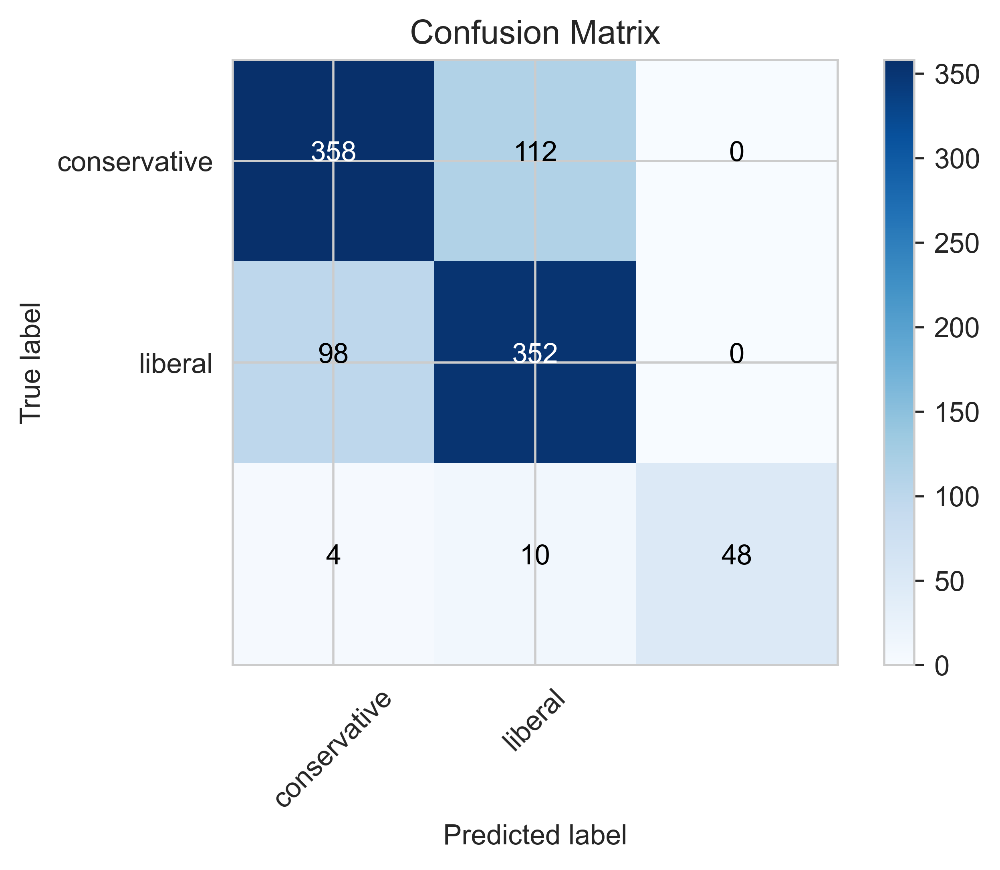

In [85]:
import itertools

plt.imshow(cnf_matrix_svm,  cmap=plt.cm.Blues)

plt.title('Confusion Matrix')
plt.ylabel('True label')
plt.xlabel('Predicted label')

class_names = ['conservative', 'liberal']
tick_marks = np.arange(len(class_names))
plt.xticks(tick_marks, class_names, rotation=45)
plt.yticks(tick_marks, class_names)

thresh = cnf_matrix_svm.max() / 2.

for i, j in itertools.product(range(cnf_matrix_svm.shape[0]), range(cnf_matrix_svm.shape[1])):
        plt.text(j, i, cnf_matrix_svm[i, j],
                 horizontalalignment="center",
                 color="white" if cnf_matrix_svm[i, j] > thresh else "black")

plt.colorbar()

plt.savefig('confusion_matrix.png', dpi=500)

* 5285 - количество верно классифицированных объектов класса "conservative" (истинно-положительные, TP);
* 1973 - количество объектов класса "liberal", которые ошибочно классифицированы как "conservative" (ложно-положительные, FP);
* 1753 - количество объектов класса "conservative", которые ошибочно классифицированы как "liberal" (ложно-отрицательные, FN);
* 6456 - количество верно классифицированных объектов класса "liberal" (истинно-отрицательные, TN).

* Gradient Boosting Classifier

In [86]:
from sklearn.ensemble import GradientBoostingClassifier

In [87]:
gb_model = GradientBoostingClassifier(n_estimators=100, learning_rate=0.1, max_depth=3, random_state=42)

gb_model.fit(X_train, y_train)

y_pred_5 = gb_model.predict(X_test)

# Оценка точности модели
accuracy = accuracy_score(y_test, y_pred_5)
print("Accuracy:", accuracy)

classification_rep = classification_report(y_test, y_pred_5)
print("Classification Report:\n", classification_rep)

Accuracy: 0.7474541751527495
Classification Report:
               precision    recall  f1-score   support

         0.0       0.76      0.72      0.74       470
         1.0       0.71      0.77      0.74       450
       999.0       1.00      0.77      0.87        62

    accuracy                           0.75       982
   macro avg       0.82      0.76      0.78       982
weighted avg       0.75      0.75      0.75       982



Confusion Matrix:
 [[340 130   0]
 [104 346   0]
 [  3  11  48]]


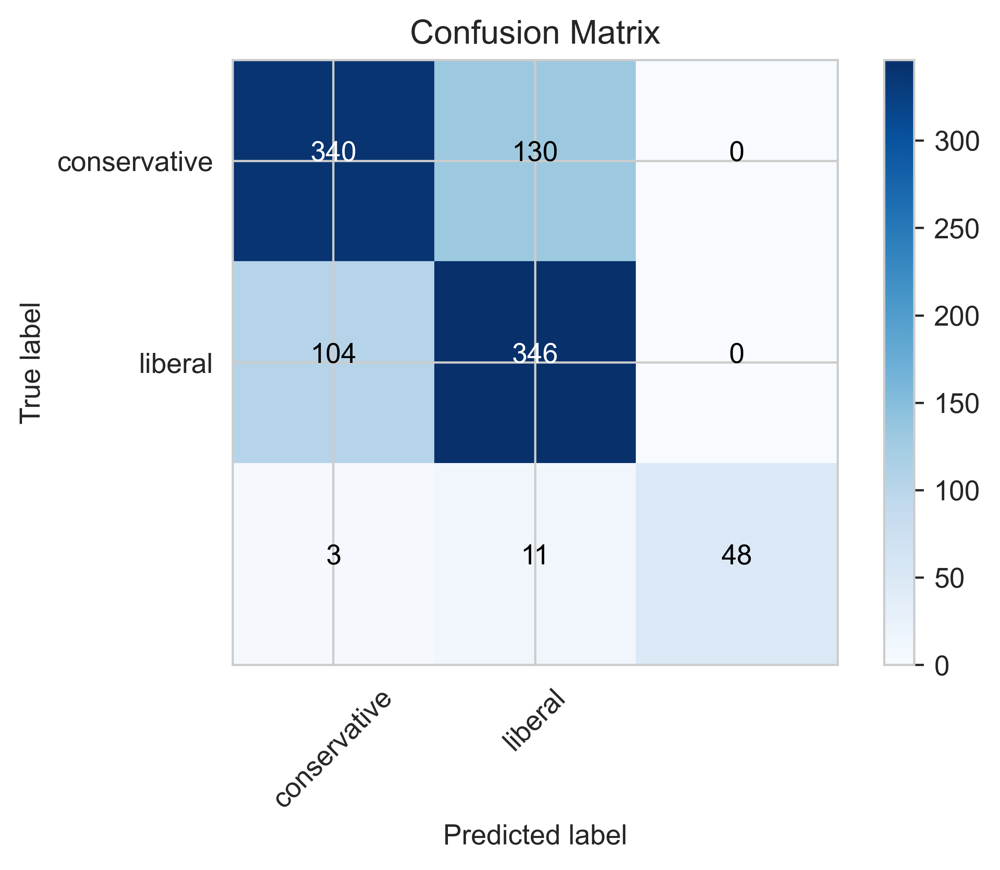

In [88]:
# Confusion Matrix
cnf_matrix_gbc = confusion_matrix(y_test, y_pred_5)
print('Confusion Matrix:\n', cnf_matrix_gbc)

plt.imshow(cnf_matrix_gbc,  cmap=plt.cm.Blues)

plt.title('Confusion Matrix')
plt.ylabel('True label')
plt.xlabel('Predicted label')

class_names = ['conservative', 'liberal']
tick_marks = np.arange(len(class_names))
plt.xticks(tick_marks, class_names, rotation=45)
plt.yticks(tick_marks, class_names)

thresh = cnf_matrix_gbc.max() / 2.

for i, j in itertools.product(range(cnf_matrix_gbc.shape[0]), range(cnf_matrix_gbc.shape[1])):
        plt.text(j, i, cnf_matrix_gbc[i, j],
                 horizontalalignment="center",
                 color="white" if cnf_matrix_gbc[i, j] > thresh else "black")

plt.colorbar()

plt.savefig('confusion_matrix.png', dpi=500)

* NB

In [89]:
from sklearn.naive_bayes import GaussianNB

In [90]:
nb_model = GaussianNB()

nb_model.fit(X_train, y_train)

y_pred_6 = nb_model.predict(X_test)

# Оценка точности модели
accuracy = accuracy_score(y_test, y_pred_6)
print("Accuracy:", accuracy)

classification_rep = classification_report(y_test, y_pred_6)
print("Classification Report:\n", classification_rep)

Accuracy: 0.5784114052953157
Classification Report:
               precision    recall  f1-score   support

         0.0       0.69      0.61      0.65       470
         1.0       0.67      0.52      0.58       450
       999.0       0.22      0.79      0.35        62

    accuracy                           0.58       982
   macro avg       0.53      0.64      0.53       982
weighted avg       0.65      0.58      0.60       982



Confusion Matrix:
 [[286 109  75]
 [121 233  96]
 [  5   8  49]]


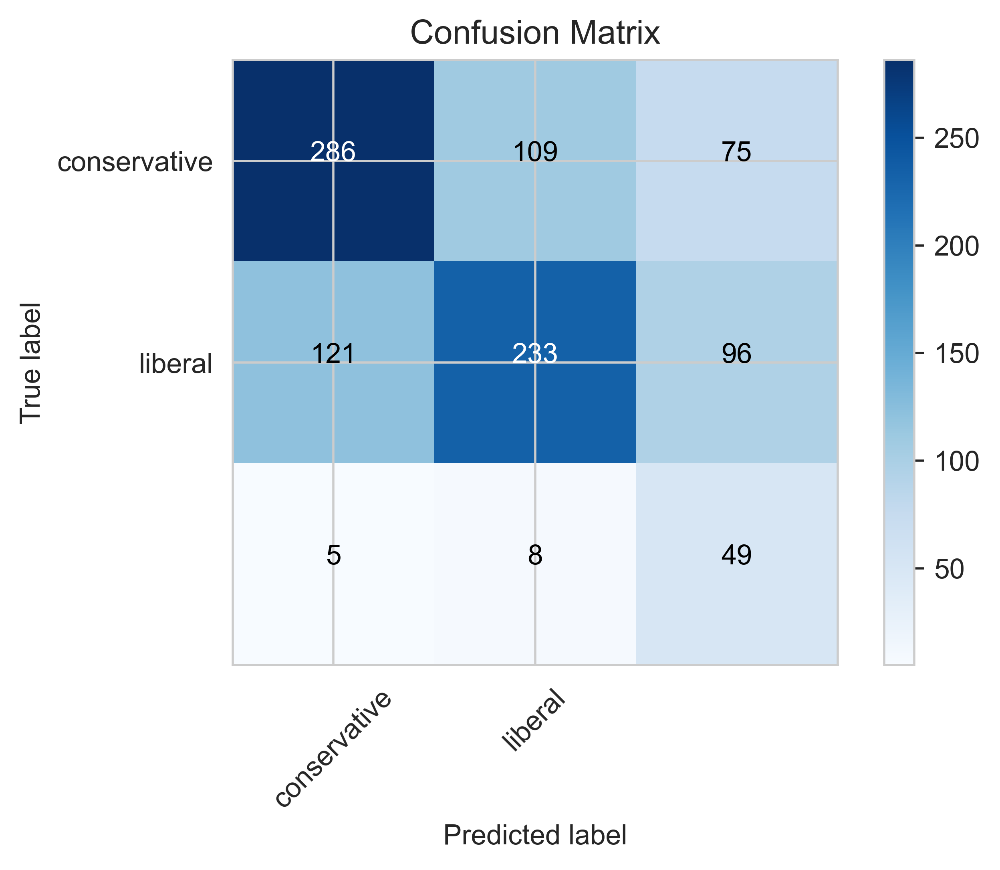

In [91]:
# Confusion Matrix
cnf_matrix_nb = confusion_matrix(y_test, y_pred_6)
print('Confusion Matrix:\n', cnf_matrix_nb)

plt.imshow(cnf_matrix_nb,  cmap=plt.cm.Blues)

plt.title('Confusion Matrix')
plt.ylabel('True label')
plt.xlabel('Predicted label')

class_names = ['conservative', 'liberal']
tick_marks = np.arange(len(class_names))
plt.xticks(tick_marks, class_names, rotation=45)
plt.yticks(tick_marks, class_names)

thresh = cnf_matrix_nb.max() / 2.

for i, j in itertools.product(range(cnf_matrix_nb.shape[0]), range(cnf_matrix_nb.shape[1])):
        plt.text(j, i, cnf_matrix_nb[i, j],
                 horizontalalignment="center",
                 color="white" if cnf_matrix_nb[i, j] > thresh else "black")

plt.colorbar()

plt.savefig('confusion_matrix.png', dpi=500)

* Модель бустинга со стохастическим градиентным спуском (SGB)

In [92]:
sgb_model = GradientBoostingClassifier(loss='deviance', n_estimators=100, learning_rate=0.1, subsample=0.5, max_depth=3, random_state=42)

In [93]:
sgb_model.fit(X_train, y_train)
y_pred_7 = sgb_model.predict(X_test)

/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:280: FutureWarning:

The loss parameter name 'deviance' was deprecated in v1.1 and will be removed in version 1.3. Use the new parameter name 'log_loss' which is equivalent.



In [94]:
# Оценка точности модели
accuracy = accuracy_score(y_test, y_pred_7)
print("Accuracy:", accuracy)

classification_rep = classification_report(y_test, y_pred_7)
print("Classification Report:\n", classification_rep)

Accuracy: 0.7576374745417516
Classification Report:
               precision    recall  f1-score   support

         0.0       0.77      0.74      0.75       470
         1.0       0.72      0.78      0.75       450
       999.0       1.00      0.77      0.87        62

    accuracy                           0.76       982
   macro avg       0.83      0.76      0.79       982
weighted avg       0.76      0.76      0.76       982



Confusion Matrix:
 [[346 124   0]
 [100 350   0]
 [  4  10  48]]


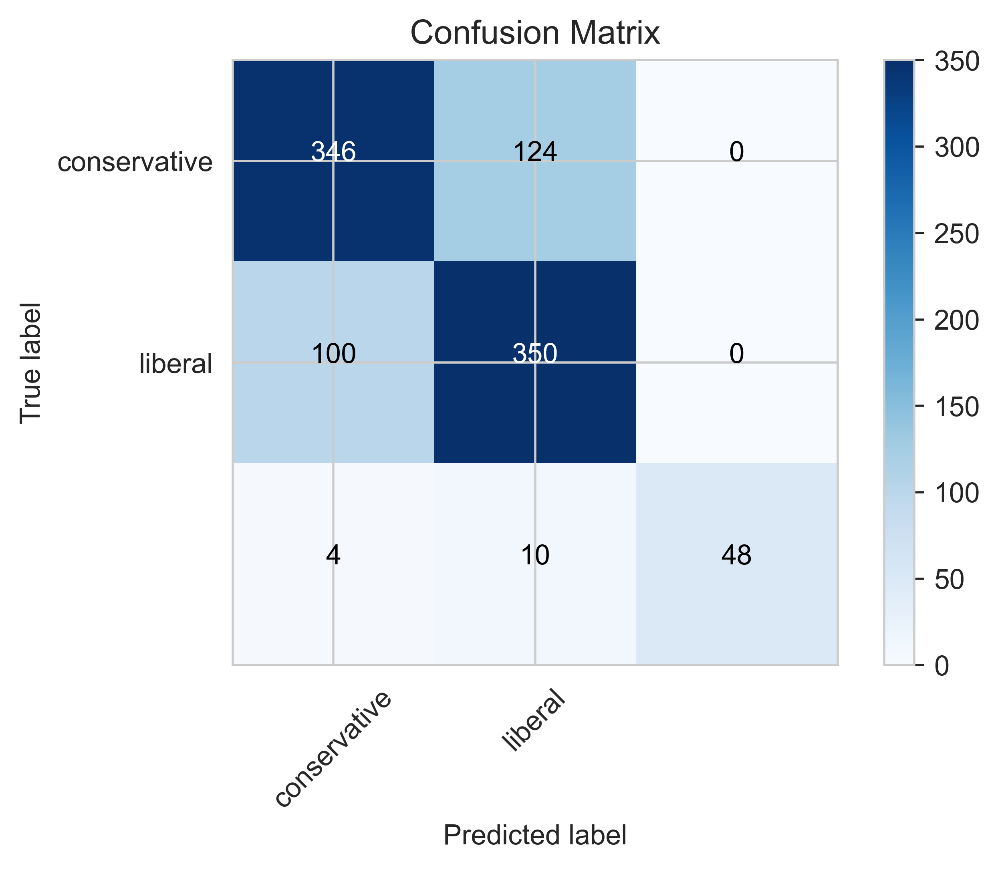

In [95]:
# Confusion Matrix
cnf_matrix_7 = confusion_matrix(y_test, y_pred_7)
print('Confusion Matrix:\n', cnf_matrix_7)

plt.imshow(cnf_matrix_7,  cmap=plt.cm.Blues)

plt.title('Confusion Matrix')
plt.ylabel('True label')
plt.xlabel('Predicted label')

class_names = ['conservative', 'liberal']
tick_marks = np.arange(len(class_names))
plt.xticks(tick_marks, class_names, rotation=45)
plt.yticks(tick_marks, class_names)

thresh = cnf_matrix_7.max() / 2.

for i, j in itertools.product(range(cnf_matrix_7.shape[0]), range(cnf_matrix_7.shape[1])):
        plt.text(j, i, cnf_matrix_7[i, j],
                 horizontalalignment="center",
                 color="white" if cnf_matrix_7[i, j] > thresh else "black")

plt.colorbar()

plt.savefig('confusion_matrix.png', dpi=500)

--------

* Предсказание исхода дела (partyWinning)

Values:
1 no favorable disposition for petitioning party apparent
2 petitioning party received a favorable disposition

In [96]:
pw = df_justice['partyWinning'].value_counts()

print(pw)

partyWinning
1.0    3385
0.0    1468
2.0      45
3.0       9
Name: count, dtype: int64


In [97]:
pw.isna().sum()

0

In [98]:
df_pw = df_justice

In [99]:
columns_to_remove = ['justice', 'docketId', 'caseIssuesId', 'voteId','dateDecision',
                                         'lexisCite', 'caseName',
                                        'adminActionState', 'caseOriginState',
                                        'caseSourceState', 'declarationUncon',
                                        'caseDispositionUnusual', 'voteUnclear',
                                        'decisionDirectionDissent', 'authorityDecision1', 'authorityDecision2', 'majOpinWriter',
                                        'splitVote', 'dateArgument', 'dateRearg',
                                        'term', 'caseDisposition', 'decisionDirection',
                                        'majVotes', 'minVotes', 'majority', 'vote', 'opinion',
                                       'precedentAlteration', 'issueArea', 'justiceName']

df_pw = df_pw.drop(columns_to_remove, axis=1)

In [100]:
df_pw['caseId'] = df_pw['caseId'].str.replace('-', '.')

In [101]:
df_pw = df_pw.drop(df_pw[(df_pw['partyWinning'] == 2.0) | (df_pw['partyWinning'] == 3.0)].index)

df_pw['partyWinning'] = df_pw['partyWinning'].replace({0.0: 1, 1.0: 2})

In [102]:
df_pw

,caseId,decisionType,naturalCourt,chief,petitioner,respondent,jurisdiction,adminAction,threeJudgeFdc,caseOrigin,caseSource,lcDisagreement,certReason,lcDisposition,lcDispositionDirection,partyWinning,issue,lawType,lawSupp,direction
77045,2014.003,1,1704,Roberts,215.0,7.0,1.0,999.0,0.0,46.0,28.0,0.0,12.0,2.0,1.0,2.0,30160.0,6.0,600.0,2.0
77046,2014.003,1,1704,Roberts,215.0,7.0,1.0,999.0,0.0,46.0,28.0,0.0,12.0,2.0,1.0,2.0,30160.0,6.0,600.0,2.0
77047,2014.003,1,1704,Roberts,215.0,7.0,1.0,999.0,0.0,46.0,28.0,0.0,12.0,2.0,1.0,2.0,30160.0,6.0,600.0,2.0
77048,2014.003,1,1704,Roberts,215.0,7.0,1.0,999.0,0.0,46.0,28.0,0.0,12.0,2.0,1.0,2.0,30160.0,6.0,600.0,2.0
77049,2014.003,1,1704,Roberts,215.0,7.0,1.0,999.0,0.0,46.0,28.0,0.0,12.0,2.0,1.0,2.0,30160.0,6.0,600.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
82010,2021.069,1,1709,Roberts,422.0,28.0,1.0,120.0,0.0,120.0,25.0,0.0,12.0,2.0,1.0,2.0,20110.0,3.0,344.0,2.0
82011,2021.069,1,1709,Roberts,422.0,28.0,1.0,120.0,0.0,120.0,25.0,0.0,12.0,2.0,1.0,2.0,20110.0,3.0,344.0,2.0
82012,2021.069,1,1709,Roberts,422.0,28.0,1.0,120.0,0.0,120.0,25.0,0.0,12.0,2.0,1.0,2.0,20110.0,3.0,344.0,1.0
82013,2021.069,1,1709,Roberts,422.0,28.0,1.0,120.0,0.0,120.0,25.0,0.0,12.0,2.0,1.0,2.0,20110.0,3.0,344.0,2.0


In [103]:
categorical_features_pw = ['chief', 'caseId']

# One-Hot Encoding
one_hot_encoded = pd.get_dummies(df_pw[categorical_features_pw])
df_action_state = pd.concat([df_pw, one_hot_encoded], axis=1)
df_pw.drop(categorical_features_pw, axis=1, inplace=True)

In [104]:
df_pw

,decisionType,naturalCourt,petitioner,respondent,jurisdiction,adminAction,threeJudgeFdc,caseOrigin,caseSource,lcDisagreement,certReason,lcDisposition,lcDispositionDirection,partyWinning,issue,lawType,lawSupp,direction
77045,1,1704,215.0,7.0,1.0,999.0,0.0,46.0,28.0,0.0,12.0,2.0,1.0,2.0,30160.0,6.0,600.0,2.0
77046,1,1704,215.0,7.0,1.0,999.0,0.0,46.0,28.0,0.0,12.0,2.0,1.0,2.0,30160.0,6.0,600.0,2.0
77047,1,1704,215.0,7.0,1.0,999.0,0.0,46.0,28.0,0.0,12.0,2.0,1.0,2.0,30160.0,6.0,600.0,2.0
77048,1,1704,215.0,7.0,1.0,999.0,0.0,46.0,28.0,0.0,12.0,2.0,1.0,2.0,30160.0,6.0,600.0,2.0
77049,1,1704,215.0,7.0,1.0,999.0,0.0,46.0,28.0,0.0,12.0,2.0,1.0,2.0,30160.0,6.0,600.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
82010,1,1709,422.0,28.0,1.0,120.0,0.0,120.0,25.0,0.0,12.0,2.0,1.0,2.0,20110.0,3.0,344.0,2.0
82011,1,1709,422.0,28.0,1.0,120.0,0.0,120.0,25.0,0.0,12.0,2.0,1.0,2.0,20110.0,3.0,344.0,2.0
82012,1,1709,422.0,28.0,1.0,120.0,0.0,120.0,25.0,0.0,12.0,2.0,1.0,2.0,20110.0,3.0,344.0,1.0
82013,1,1709,422.0,28.0,1.0,120.0,0.0,120.0,25.0,0.0,12.0,2.0,1.0,2.0,20110.0,3.0,344.0,2.0


* LR

In [105]:
X_pw = df_pw.drop('partyWinning', axis=1)
y_pw = df_pw['partyWinning']

X_train, X_test, y_train, y_test = train_test_split(X_pw, y_pw, test_size=0.2, random_state=42)

models = [
    ('Logistic Regression', LogisticRegression(random_state=42)),
    ('Decision Tree', DecisionTreeClassifier(random_state=42)),
    ('Random Forest', RandomForestClassifier(random_state=42)),
    ('Gradient Boosting', GradientBoostingClassifier(random_state=42))
]

name, m = models[0]
m.fit(X_train, y_train)
y_pred_pw = m.predict(X_test)
accuracy = accuracy_score(y_test, y_pred_pw)
print(f'{name} accuracy: {accuracy:.2f}')
print(classification_report(y_test, y_pred_pw))

Logistic Regression accuracy: 0.74
              precision    recall  f1-score   support

         1.0       0.70      0.11      0.19       270
         2.0       0.74      0.98      0.84       701

    accuracy                           0.74       971
   macro avg       0.72      0.55      0.52       971
weighted avg       0.73      0.74      0.66       971



/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



* DTC

In [106]:
name, m = models[1]
m.fit(X_train, y_train)
y_pred_pw = m.predict(X_test)
accuracy = accuracy_score(y_test, y_pred_pw)
print(f'{name} accuracy: {accuracy:.2f}')
print(classification_report(y_test, y_pred_pw))

Decision Tree accuracy: 0.99
              precision    recall  f1-score   support

         1.0       1.00      0.99      0.99       270
         2.0       0.99      1.00      1.00       701

    accuracy                           0.99       971
   macro avg       1.00      0.99      0.99       971
weighted avg       0.99      0.99      0.99       971



* RF

In [107]:
name, m = models[2]
m.fit(X_train, y_train)
y_pred_pw = m.predict(X_test)
accuracy = accuracy_score(y_test, y_pred_pw)
print(f'{name} accuracy: {accuracy:.2f}')
print(classification_report(y_test, y_pred_pw))

Random Forest accuracy: 1.00
              precision    recall  f1-score   support

         1.0       1.00      1.00      1.00       270
         2.0       1.00      1.00      1.00       701

    accuracy                           1.00       971
   macro avg       1.00      1.00      1.00       971
weighted avg       1.00      1.00      1.00       971



* GB

In [108]:
name, m = models[3]
m.fit(X_train, y_train)
y_pred_pw = m.predict(X_test)
accuracy = accuracy_score(y_test, y_pred_pw)
print(f'{name} accuracy: {accuracy:.2f}')
print(classification_report(y_test, y_pred_pw))

Gradient Boosting accuracy: 0.94
              precision    recall  f1-score   support

         1.0       0.97      0.80      0.88       270
         2.0       0.93      0.99      0.96       701

    accuracy                           0.94       971
   macro avg       0.95      0.90      0.92       971
weighted avg       0.94      0.94      0.94       971



--------

* Предсказание голосования судьи

In [109]:
vote_counts = df_justice['vote'].value_counts()

print(vote_counts)

vote
1.0    3484
2.0     822
3.0     309
4.0     150
0.0      71
8.0      48
5.0      15
7.0       7
6.0       1
Name: count, dtype: int64


In [110]:
df_vote = df_justice

In [111]:
columns_to_remove_vote = ['justice', 'docketId', 'caseIssuesId', 'voteId','dateDecision',
                                         'lexisCite', 'caseName',
                                        'adminActionState', 'caseOriginState',
                                        'caseSourceState', 'declarationUncon',
                                        'caseDispositionUnusual',
                                        'decisionDirectionDissent', 'authorityDecision1', 'authorityDecision2', 'majOpinWriter',
                                        'dateArgument', 'dateRearg',
                                        'term', 'caseDisposition', 'decisionDirection',
                                        'majVotes', 'minVotes',
                                       'precedentAlteration', 'issueArea']

df_vote = df_vote.drop(columns_to_remove_vote, axis=1)

In [112]:
df_vote['caseId'] = df_vote['caseId'].str.replace('-', '.')

In [113]:
enc_data_vote = pd.get_dummies(df_vote, columns = ['caseId', 'justiceName', 'chief'], drop_first = True)
enc_data_vote

,decisionType,naturalCourt,petitioner,respondent,jurisdiction,adminAction,threeJudgeFdc,caseOrigin,caseSource,lcDisagreement,...,justiceName_AScalia,justiceName_BMKavanaugh,justiceName_CThomas,justiceName_EKagan,justiceName_JGRoberts,justiceName_NMGorsuch,justiceName_RBGinsburg,justiceName_SAAlito,justiceName_SGBreyer,justiceName_SSotomayor
77045,1,1704,215.0,7.0,1.0,999.0,0.0,46.0,28.0,0.0,...,False,False,False,False,True,False,False,False,False,False
77046,1,1704,215.0,7.0,1.0,999.0,0.0,46.0,28.0,0.0,...,True,False,False,False,False,False,False,False,False,False
77047,1,1704,215.0,7.0,1.0,999.0,0.0,46.0,28.0,0.0,...,False,False,False,False,False,False,False,False,False,False
77048,1,1704,215.0,7.0,1.0,999.0,0.0,46.0,28.0,0.0,...,False,False,True,False,False,False,False,False,False,False
77049,1,1704,215.0,7.0,1.0,999.0,0.0,46.0,28.0,0.0,...,False,False,False,False,False,False,True,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
82010,1,1709,422.0,28.0,1.0,120.0,0.0,120.0,25.0,0.0,...,False,False,False,False,False,False,False,False,False,True
82011,1,1709,422.0,28.0,1.0,120.0,0.0,120.0,25.0,0.0,...,False,False,False,True,False,False,False,False,False,False
82012,1,1709,422.0,28.0,1.0,120.0,0.0,120.0,25.0,0.0,...,False,False,False,False,False,True,False,False,False,False
82013,1,1709,422.0,28.0,1.0,120.0,0.0,120.0,25.0,0.0,...,False,True,False,False,False,False,False,False,False,False


In [114]:
X_vote = enc_data_vote.drop('vote', axis=1)
y_vote = enc_data_vote['vote']

X_train, X_test, y_train, y_test = train_test_split(X_vote, y_vote, test_size=0.2, random_state=42)

In [115]:
from sklearn.neural_network import MLPClassifier

models_vote = [
    ('Logistic Regression', LogisticRegression(multi_class='multinomial', solver='lbfgs', max_iter=1000)),
    ('Decision Tree', DecisionTreeClassifier()),
    ('Random Forest', RandomForestClassifier()),
    ('Gradient Boosting', GradientBoostingClassifier()),
    ('SVM', SVC(decision_function_shape='ovr'))
]

* LR

In [116]:
name, m = models_vote[0]
m.fit(X_train, y_train)
y_pred_vote = m.predict(X_test)
accuracy = accuracy_score(y_test, y_pred_vote)
print(f'{name} accuracy: {accuracy:.2f}')
print(classification_report(y_test, y_pred_vote))

Logistic Regression accuracy: 0.73
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00        12
         1.0       0.72      1.00      0.84       689
         2.0       0.00      0.00      0.00       169
         3.0       0.00      0.00      0.00        63
         4.0       0.00      0.00      0.00        30
         5.0       0.00      0.00      0.00         2
         6.0       0.00      0.00      0.00         1
         7.0       0.00      0.00      0.00         1
         8.0       0.86      0.80      0.83        15

    accuracy                           0.73       982
   macro avg       0.29      0.31      0.30       982
weighted avg       0.53      0.73      0.61       982



/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/opt/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/opt/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior

* DTC

In [117]:
name, m = models_vote[1]
m.fit(X_train, y_train)
y_pred_vote = m.predict(X_test)
accuracy = accuracy_score(y_test, y_pred_vote)
print(f'{name} accuracy: {accuracy:.2f}')
print(classification_report(y_test, y_pred_vote))

Decision Tree accuracy: 0.89
              precision    recall  f1-score   support

         0.0       0.92      1.00      0.96        12
         1.0       0.92      0.94      0.93       689
         2.0       1.00      1.00      1.00       169
         3.0       0.37      0.37      0.37        63
         4.0       0.22      0.13      0.17        30
         5.0       0.33      0.50      0.40         2
         6.0       0.00      0.00      0.00         1
         7.0       1.00      1.00      1.00         1
         8.0       1.00      1.00      1.00        15

    accuracy                           0.89       982
   macro avg       0.64      0.66      0.65       982
weighted avg       0.88      0.89      0.88       982



/opt/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/opt/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/opt/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



* RF

In [118]:
name, m = models_vote[2]
m.fit(X_train, y_train)
y_pred_vote = m.predict(X_test)
accuracy = accuracy_score(y_test, y_pred_vote)
print(f'{name} accuracy: {accuracy:.2f}')
print(classification_report(y_test, y_pred_vote))

Random Forest accuracy: 0.90
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00        12
         1.0       0.89      0.98      0.93       689
         2.0       1.00      1.00      1.00       169
         3.0       0.53      0.14      0.22        63
         4.0       0.11      0.03      0.05        30
         5.0       0.00      0.00      0.00         2
         6.0       0.00      0.00      0.00         1
         7.0       1.00      1.00      1.00         1
         8.0       1.00      1.00      1.00        15

    accuracy                           0.90       982
   macro avg       0.61      0.57      0.58       982
weighted avg       0.86      0.90      0.87       982



/opt/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/opt/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/opt/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



* GB

In [119]:
name, m = models_vote[3]
m.fit(X_train, y_train)
y_pred_vote = m.predict(X_test)
accuracy = accuracy_score(y_test, y_pred_vote)
print(f'{name} accuracy: {accuracy:.2f}')
print(classification_report(y_test, y_pred_vote))

Gradient Boosting accuracy: 0.91
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00        12
         1.0       0.91      0.98      0.95       689
         2.0       1.00      1.00      1.00       169
         3.0       0.52      0.27      0.35        63
         4.0       0.31      0.13      0.19        30
         5.0       0.00      0.00      0.00         2
         6.0       0.00      0.00      0.00         1
         7.0       1.00      1.00      1.00         1
         8.0       1.00      1.00      1.00        15

    accuracy                           0.91       982
   macro avg       0.64      0.60      0.61       982
weighted avg       0.88      0.91      0.89       982



/opt/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/opt/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/opt/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



-------

* Предсказание изменения прецедентного права

Values:
1 no determinable alteration of precedent
2 precedent altered

In [120]:
print(precedent_counts)

precedentAlteration
0.0    4772
1.0     135
Name: count, dtype: int64


In [121]:
df_pr_changes = df_justice

In [122]:
columns_to_remove_precedent = ['justice', 'docketId', 'caseIssuesId', 'voteId','dateDecision',
                                         'lexisCite', 'caseName', 'adminAction', 'caseOrigin',
                                        'adminActionState', 'caseOriginState', 'caseSource',
                                        'caseSourceState','decisionDirectionDissent',
                                        'authorityDecision1', 'authorityDecision2', 'majOpinWriter',
                                        'dateArgument', 'dateRearg', 'lawSupp', 'naturalCourt',
                                        'term', 'caseDisposition', 'decisionDirection',
                                        'majVotes', 'minVotes', 'issue', 'caseId',
                                       'issueArea', 'justiceName', 'chief']

df_pr_changes = df_pr_changes.drop(columns_to_remove_precedent, axis=1)

In [123]:
df_pr_changes['precedentAlteration'] = df_pr_changes['precedentAlteration'].replace({0.0: 1, 1.0: 2})

In [124]:
df_pr_changes

,decisionType,petitioner,respondent,jurisdiction,threeJudgeFdc,lcDisagreement,certReason,lcDisposition,lcDispositionDirection,declarationUncon,caseDispositionUnusual,partyWinning,precedentAlteration,voteUnclear,lawType,splitVote,vote,opinion,direction,majority
77045,1,215.0,7.0,1.0,0.0,0.0,12.0,2.0,1.0,1.0,0.0,1.0,1.0,0.0,6.0,1,1.0,1.0,2.0,2.0
77046,1,215.0,7.0,1.0,0.0,0.0,12.0,2.0,1.0,1.0,0.0,1.0,1.0,0.0,6.0,1,1.0,1.0,2.0,2.0
77047,1,215.0,7.0,1.0,0.0,0.0,12.0,2.0,1.0,1.0,0.0,1.0,1.0,0.0,6.0,1,1.0,1.0,2.0,2.0
77048,1,215.0,7.0,1.0,0.0,0.0,12.0,2.0,1.0,1.0,0.0,1.0,1.0,0.0,6.0,1,1.0,1.0,2.0,2.0
77049,1,215.0,7.0,1.0,0.0,0.0,12.0,2.0,1.0,1.0,0.0,1.0,1.0,0.0,6.0,1,3.0,2.0,2.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
82010,1,422.0,28.0,1.0,0.0,0.0,12.0,2.0,1.0,1.0,0.0,1.0,1.0,0.0,3.0,1,1.0,1.0,2.0,2.0
82011,1,422.0,28.0,1.0,0.0,0.0,12.0,2.0,1.0,1.0,0.0,1.0,1.0,0.0,3.0,1,1.0,1.0,2.0,2.0
82012,1,422.0,28.0,1.0,0.0,0.0,12.0,2.0,1.0,1.0,0.0,1.0,1.0,0.0,3.0,1,2.0,1.0,1.0,1.0
82013,1,422.0,28.0,1.0,0.0,0.0,12.0,2.0,1.0,1.0,0.0,1.0,1.0,0.0,3.0,1,3.0,2.0,2.0,2.0


In [125]:
X_precedent = df_pr_changes.drop("precedentAlteration", axis=1)
y_precedent = df_pr_changes["precedentAlteration"]

X_train, X_test, y_train, y_test = train_test_split(X_precedent, y_precedent, test_size=0.2, random_state=42)

In [126]:
models_precedent = [
    ('Logistic Regression', LogisticRegression(random_state=42)),
    ('Decision Tree', DecisionTreeClassifier(random_state=42)),
    ('Random Forest', RandomForestClassifier(random_state=42)),
    ('Gradient Boosting', GradientBoostingClassifier(random_state=42)),
    ('SVM', SVC())
]

* LR

In [127]:
name, m = models_precedent[0]
m.fit(X_train, y_train)
y_pred_precedent = m.predict(X_test)
accuracy = accuracy_score(y_test, y_pred_precedent)
print(f'{name} accuracy: {accuracy:.2f}')
print(classification_report(y_test, y_pred_precedent))

Logistic Regression accuracy: 0.97
              precision    recall  f1-score   support

         1.0       0.97      1.00      0.99       954
         2.0       0.50      0.11      0.18        28

    accuracy                           0.97       982
   macro avg       0.74      0.55      0.58       982
weighted avg       0.96      0.97      0.96       982



/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



* DT

In [128]:
name, m = models_precedent[1]
m.fit(X_train, y_train)
y_pred_precedent = m.predict(X_test)
accuracy = accuracy_score(y_test, y_pred_precedent)
print(f'{name} accuracy: {accuracy:.2f}')
print(classification_report(y_test, y_pred_precedent))

Decision Tree accuracy: 1.00
              precision    recall  f1-score   support

         1.0       1.00      1.00      1.00       954
         2.0       1.00      1.00      1.00        28

    accuracy                           1.00       982
   macro avg       1.00      1.00      1.00       982
weighted avg       1.00      1.00      1.00       982



* RF

In [129]:
name, m = models_precedent[2]
m.fit(X_train, y_train)
y_pred_precedent = m.predict(X_test)
accuracy = accuracy_score(y_test, y_pred_precedent)
print(f'{name} accuracy: {accuracy:.2f}')
print(classification_report(y_test, y_pred_precedent))

Random Forest accuracy: 1.00
              precision    recall  f1-score   support

         1.0       1.00      1.00      1.00       954
         2.0       1.00      0.96      0.98        28

    accuracy                           1.00       982
   macro avg       1.00      0.98      0.99       982
weighted avg       1.00      1.00      1.00       982



* GB

In [130]:
name, m = models_precedent[3]
m.fit(X_train, y_train)
y_pred_precedent = m.predict(X_test)
accuracy = accuracy_score(y_test, y_pred_precedent)
print(f'{name} accuracy: {accuracy:.2f}')
print(classification_report(y_test, y_pred_precedent))

Gradient Boosting accuracy: 0.99
              precision    recall  f1-score   support

         1.0       0.99      1.00      1.00       954
         2.0       1.00      0.75      0.86        28

    accuracy                           0.99       982
   macro avg       1.00      0.88      0.93       982
weighted avg       0.99      0.99      0.99       982



* SVM

In [131]:
name, m = models_precedent[4]
m.fit(X_train, y_train)
y_pred_precedent = m.predict(X_test)
accuracy = accuracy_score(y_test, y_pred_precedent)
print(f'{name} accuracy: {accuracy:.2f}')
print(classification_report(y_test, y_pred_precedent))

SVM accuracy: 0.97
              precision    recall  f1-score   support

         1.0       0.97      1.00      0.99       954
         2.0       0.00      0.00      0.00        28

    accuracy                           0.97       982
   macro avg       0.49      0.50      0.49       982
weighted avg       0.94      0.97      0.96       982



/opt/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/opt/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/opt/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



-------------

* Предсказание отрасли права

In [132]:
branch_counts = df_justice['issueArea'].value_counts()

print(branch_counts)

issueArea
1.0      1146
8.0      1133
2.0       851
9.0       623
3.0       293
4.0       178
10.0      169
7.0       123
11.0       71
13.0       71
5.0        71
12.0       54
6.0        53
14.0       36
999.0      35
Name: count, dtype: int64


In [133]:
df_branch = df_justice

df_branch = df_branch.drop(labels=df_branch.loc[df_branch["issueArea"] == 999].index)

columns_to_remove_branch = ['justice', 'docketId', 'caseIssuesId', 'voteId','dateDecision',
                                         'lexisCite', 'caseName', 'caseOrigin', 'threeJudgeFdc',
                                        'adminActionState', 'caseOriginState', 'caseSource', 'certReason',
                                        'caseSourceState','decisionDirectionDissent', 'lcDisagreement',
                                        'authorityDecision1', 'authorityDecision2', 'majOpinWriter',
                                        'dateArgument', 'dateRearg', 'lawSupp', 'naturalCourt',
                                        'term', 'caseDisposition', 'decisionDirection', 'adminAction','lcDispositionDirection', 'declarationUncon', 'voteUnclear', 'caseDispositionUnusual', 'partyWinning', 'precedentAlteration',
                                        'majVotes', 'minVotes', 'issue', 'caseId', 'lcDisposition', 'justiceName', 'chief', 'splitVote', 'vote', 'majority']

df_branch = df_branch.drop(columns_to_remove_branch, axis=1)

In [134]:
df_branch

,decisionType,petitioner,respondent,jurisdiction,issueArea,lawType,opinion,direction
77045,1,215.0,7.0,1.0,3.0,6.0,1.0,2.0
77046,1,215.0,7.0,1.0,3.0,6.0,1.0,2.0
77047,1,215.0,7.0,1.0,3.0,6.0,1.0,2.0
77048,1,215.0,7.0,1.0,3.0,6.0,1.0,2.0
77049,1,215.0,7.0,1.0,3.0,6.0,2.0,2.0
...,...,...,...,...,...,...,...,...
82010,1,422.0,28.0,1.0,2.0,3.0,1.0,2.0
82011,1,422.0,28.0,1.0,2.0,3.0,1.0,2.0
82012,1,422.0,28.0,1.0,2.0,3.0,1.0,1.0
82013,1,422.0,28.0,1.0,2.0,3.0,2.0,2.0


In [135]:
X_branch = df_branch.drop("issueArea", axis=1)
y_branch = df_branch["issueArea"]

X_train, X_test, y_train, y_test = train_test_split(X_branch, y_branch, test_size=0.2, random_state=42)

models_branch = [
    ('Decision Tree', DecisionTreeClassifier()),
    ('Random Forest', RandomForestClassifier()),
    ('Gradient Boosting', GradientBoostingClassifier())
]

* DT

In [136]:
name, m = models_branch[0]
m.fit(X_train, y_train)
y_pred_branch = m.predict(X_test)
accuracy = accuracy_score(y_test, y_pred_branch)
print(f'{name} accuracy: {accuracy:.2f}')
print(classification_report(y_test, y_pred_branch))

Decision Tree accuracy: 0.97
              precision    recall  f1-score   support

         1.0       0.92      0.98      0.95       225
         2.0       0.98      0.98      0.98       173
         3.0       1.00      0.89      0.94        62
         4.0       0.92      0.80      0.85        44
         5.0       1.00      1.00      1.00        10
         6.0       1.00      1.00      1.00        10
         7.0       1.00      1.00      1.00        27
         8.0       0.99      1.00      1.00       235
         9.0       0.99      0.95      0.97       106
        10.0       1.00      1.00      1.00        33
        11.0       1.00      1.00      1.00        18
        12.0       1.00      1.00      1.00         7
        13.0       1.00      1.00      1.00        19
        14.0       1.00      1.00      1.00         6

    accuracy                           0.97       975
   macro avg       0.99      0.97      0.98       975
weighted avg       0.97      0.97      0.97       9

* RF

In [137]:
name, m = models_branch[1]
m.fit(X_train, y_train)
y_pred_branch = m.predict(X_test)
accuracy = accuracy_score(y_test, y_pred_branch)
print(f'{name} accuracy: {accuracy:.2f}')
print(classification_report(y_test, y_pred_branch))

Random Forest accuracy: 0.95
              precision    recall  f1-score   support

         1.0       0.92      0.98      0.95       225
         2.0       0.96      0.95      0.96       173
         3.0       0.98      0.85      0.91        62
         4.0       0.90      0.80      0.84        44
         5.0       1.00      1.00      1.00        10
         6.0       1.00      0.90      0.95        10
         7.0       1.00      1.00      1.00        27
         8.0       0.95      0.98      0.97       235
         9.0       0.93      0.92      0.92       106
        10.0       0.91      0.88      0.89        33
        11.0       1.00      1.00      1.00        18
        12.0       1.00      1.00      1.00         7
        13.0       1.00      0.95      0.97        19
        14.0       1.00      1.00      1.00         6

    accuracy                           0.95       975
   macro avg       0.97      0.94      0.95       975
weighted avg       0.95      0.95      0.95       9

* GB

In [138]:
name, m = models_branch[2]
m.fit(X_train, y_train)
y_pred_branch = m.predict(X_test)
accuracy = accuracy_score(y_test, y_pred_branch)
print(f'{name} accuracy: {accuracy:.2f}')
print(classification_report(y_test, y_pred_branch))

Gradient Boosting accuracy: 0.91
              precision    recall  f1-score   support

         1.0       0.87      0.99      0.92       225
         2.0       0.91      0.88      0.89       173
         3.0       0.98      0.89      0.93        62
         4.0       1.00      0.73      0.84        44
         5.0       1.00      1.00      1.00        10
         6.0       1.00      1.00      1.00        10
         7.0       1.00      1.00      1.00        27
         8.0       0.90      0.96      0.93       235
         9.0       0.91      0.73      0.81       106
        10.0       0.97      0.85      0.90        33
        11.0       1.00      1.00      1.00        18
        12.0       1.00      1.00      1.00         7
        13.0       1.00      1.00      1.00        19
        14.0       1.00      1.00      1.00         6

    accuracy                           0.91       975
   macro avg       0.97      0.93      0.95       975
weighted avg       0.92      0.91      0.91    

-------

* Предсказание позиции судьи по спору

Values:
1 justice wrote no opinion
2 justice wrote an opinion
3 justice co-authored an opinion

In [139]:
print(df_justice['opinion'].value_counts())

opinion
1.0      3645
2.0      1184
999.0      72
3.0         6
Name: count, dtype: int64


In [140]:
df_opinion = df_justice

df_opinion = df_opinion.drop(labels=df_opinion.loc[df_opinion["opinion"] == 999].index)

columns_to_remove_opinion = ['justice', 'docketId', 'caseIssuesId', 'voteId','dateDecision',
                                         'lexisCite', 'caseName', 'caseOrigin',
                                        'adminActionState', 'caseOriginState', 'caseSource', 'certReason',
                                        'caseSourceState','decisionDirectionDissent', 'lcDisagreement',
                                        'authorityDecision1', 'authorityDecision2', 'majOpinWriter',
                                        'dateArgument', 'dateRearg', 'lawSupp', 'naturalCourt',
                                        'term', 'decisionDirection', 'adminAction','lcDispositionDirection', 'voteUnclear', 'majVotes', 'minVotes', 'issue', 'caseId', 'justiceName', 'chief', 'splitVote', 'vote', 'majority']

df_opinion = df_opinion.drop(columns_to_remove_opinion, axis=1)

In [141]:
df_opinion.replace({'caseDispositionUnusual': {0.0: 1, 1.0: 2},
                     'precedentAlteration': {0.0: 1, 1.0: 2},
                     'threeJudgeFdc': {0.0: 1, 1.0: 2}}, inplace=True)

In [142]:
df_opinion

,decisionType,petitioner,respondent,jurisdiction,threeJudgeFdc,lcDisposition,declarationUncon,caseDisposition,caseDispositionUnusual,partyWinning,precedentAlteration,issueArea,lawType,opinion,direction
77045,1,215.0,7.0,1.0,1.0,2.0,1.0,4.0,1.0,1.0,1.0,3.0,6.0,1.0,2.0
77046,1,215.0,7.0,1.0,1.0,2.0,1.0,4.0,1.0,1.0,1.0,3.0,6.0,1.0,2.0
77047,1,215.0,7.0,1.0,1.0,2.0,1.0,4.0,1.0,1.0,1.0,3.0,6.0,1.0,2.0
77048,1,215.0,7.0,1.0,1.0,2.0,1.0,4.0,1.0,1.0,1.0,3.0,6.0,1.0,2.0
77049,1,215.0,7.0,1.0,1.0,2.0,1.0,4.0,1.0,1.0,1.0,3.0,6.0,2.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
82010,1,422.0,28.0,1.0,1.0,2.0,1.0,4.0,1.0,1.0,1.0,2.0,3.0,1.0,2.0
82011,1,422.0,28.0,1.0,1.0,2.0,1.0,4.0,1.0,1.0,1.0,2.0,3.0,1.0,2.0
82012,1,422.0,28.0,1.0,1.0,2.0,1.0,4.0,1.0,1.0,1.0,2.0,3.0,1.0,1.0
82013,1,422.0,28.0,1.0,1.0,2.0,1.0,4.0,1.0,1.0,1.0,2.0,3.0,2.0,2.0


In [143]:
X_opinion = df_opinion.drop("opinion", axis=1)
y_opinion = df_opinion["opinion"]

X_train, X_test, y_train, y_test = train_test_split(X_opinion, y_opinion, test_size=0.2, random_state=42)

models_opinion = [
    ('Decision Tree', DecisionTreeClassifier()),
    ('Random Forest', RandomForestClassifier()),
    ('Gradient Boosting', GradientBoostingClassifier())
]

* DT

In [144]:
name, m = models_opinion[0]
m.fit(X_train, y_train)
y_pred_opinion = m.predict(X_test)
accuracy = accuracy_score(y_test, y_pred_opinion)
print(f'{name} accuracy: {accuracy:.2f}')
print(classification_report(y_test, y_pred_opinion))

Decision Tree accuracy: 0.72
              precision    recall  f1-score   support

         1.0       0.75      0.93      0.83       720
         2.0       0.26      0.07      0.11       244
         3.0       1.00      1.00      1.00         3

    accuracy                           0.72       967
   macro avg       0.67      0.67      0.65       967
weighted avg       0.63      0.72      0.65       967



* RF

In [145]:
name, m = models_opinion[1]
m.fit(X_train, y_train)
y_pred_opinion = m.predict(X_test)
accuracy = accuracy_score(y_test, y_pred_opinion)
print(f'{name} accuracy: {accuracy:.2f}')
print(classification_report(y_test, y_pred_opinion))

Random Forest accuracy: 0.70
              precision    recall  f1-score   support

         1.0       0.75      0.91      0.82       720
         2.0       0.26      0.10      0.14       244
         3.0       1.00      1.00      1.00         3

    accuracy                           0.70       967
   macro avg       0.67      0.67      0.65       967
weighted avg       0.63      0.70      0.65       967



* GB

In [146]:
name, m = models_opinion[2]
m.fit(X_train, y_train)
y_pred_opinion = m.predict(X_test)
accuracy = accuracy_score(y_test, y_pred_opinion)
print(f'{name} accuracy: {accuracy:.2f}')
print(classification_report(y_test, y_pred_opinion))

Gradient Boosting accuracy: 0.75
              precision    recall  f1-score   support

         1.0       0.75      0.99      0.85       720
         2.0       0.43      0.02      0.05       244
         3.0       1.00      1.00      1.00         3

    accuracy                           0.75       967
   macro avg       0.73      0.67      0.63       967
weighted avg       0.67      0.75      0.65       967



---------

# Метрики

* Предсказание исхода дела (partyWinning)

In [147]:
metrics_pw = []
for name, m in models_opinion:
    m.fit(X_train, y_train)
    y_pred_pw = m.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred_pw)
    report = classification_report(y_test, y_pred_pw, output_dict=True)
    metrics_pw.append({
        'Model': name,
        'Accuracy': accuracy,
        'Precision (macro)': report['macro avg']['precision'],
        'Recall (macro)': report['macro avg']['recall'],
        'F1-score (macro)': report['macro avg']['f1-score']
    })

metrics_df_pw = pd.DataFrame(metrics_pw)

In [148]:
metrics_df_pw

,Model,Accuracy,Precision (macro),Recall (macro),F1-score (macro)
0,Decision Tree,0.715615,0.669679,0.667668,0.646725
1,Random Forest,0.710445,0.687128,0.676192,0.665166
2,Gradient Boosting,0.745605,0.726015,0.671160,0.633069


* Предсказание голосования судьи

In [149]:
metrics_vote = []
for name, m in models_vote:
    m.fit(X_train, y_train)
    y_pred_vote = m.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred_vote)
    report = classification_report(y_test, y_pred_vote, output_dict=True)
    metrics_vote.append({
        'Model': name,
        'Accuracy': accuracy,
        'Precision (macro)': report['macro avg']['precision'],
        'Recall (macro)': report['macro avg']['recall'],
        'F1-score (macro)': report['macro avg']['f1-score']
    })

metrics_df_vote = pd.DataFrame(metrics_vote)

/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/opt/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/opt/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior

In [150]:
metrics_df_vote

,Model,Accuracy,Precision (macro),Recall (macro),F1-score (macro)
0,Logistic Regression,0.744571,0.248190,0.333333,0.284529
1,Decision Tree,0.715615,0.669679,0.667668,0.646725
2,Random Forest,0.705274,0.678166,0.672070,0.659978
3,Gradient Boosting,0.745605,0.726015,0.671160,0.633069
4,SVM,0.744571,0.248190,0.333333,0.284529


* Предсказание изменения прецедентного права

In [151]:
# metrics_precedent = []
# for name, m in models_precedent:
#     m.fit(X_train, y_train)
#     y_pred_vote = m.predict(X_test)
#     accuracy = accuracy_score(y_test, y_pred_precedent)
#     report = classification_report(y_test, y_pred_precedent, output_dict=True)
#     metrics_precedent.append({
#         'Model': name,
#         'Accuracy': accuracy,
#         'Precision (macro)': report['macro avg']['precision'],
#         'Recall (macro)': report['macro avg']['recall'],
#         'F1-score (macro)': report['macro avg']['f1-score']
#     })
#
# metrics_df_precedent = pd.DataFrame(metrics_precedent)

In [152]:
# metrics_df_precedent

* Предсказание отрасли права

In [153]:
# metrics_branch = []
# for name, m in models_branch:
#     m.fit(X_train, y_train)
#     y_pred_vote = m.predict(X_test)
#     accuracy = accuracy_score(y_test, y_pred_branch)
#     report = classification_report(y_test, y_pred_branch, output_dict=True)
#     metrics_branch.append({
#         'Model': name,
#         'Accuracy': accuracy,
#         'Precision (macro)': report['macro avg']['precision'],
#         'Recall (macro)': report['macro avg']['recall'],
#         'F1-score (macro)': report['macro avg']['f1-score']
#     })
#
# metrics_df_branch = pd.DataFrame(metrics_branch)

In [154]:
# metrics_df_branch

* Предсказание позиции судьи по спору

In [155]:
metrics_opinion = []
for name, m in models_opinion:
    m.fit(X_train, y_train)
    y_pred_pw = m.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred_opinion)
    report = classification_report(y_test, y_pred_opinion, output_dict=True)
    metrics_opinion.append({
        'Model': name,
        'Accuracy': accuracy,
        'Precision (macro)': report['macro avg']['precision'],
        'Recall (macro)': report['macro avg']['recall'],
        'F1-score (macro)': report['macro avg']['f1-score']
    })

metrics_df_opinion = pd.DataFrame(metrics_opinion)

In [156]:
metrics_df_opinion

,Model,Accuracy,Precision (macro),Recall (macro),F1-score (macro)
0,Decision Tree,0.745605,0.726015,0.67116,0.633069
1,Random Forest,0.745605,0.726015,0.67116,0.633069
2,Gradient Boosting,0.745605,0.726015,0.67116,0.633069


----------